# CODEBOOK NIKOLAOS ATHANASOPOULOS 
# Explaining Tumor Classifiers

#### ALL NECESSARY MODULES CAN BE SEEN IN THE PIP LIST IN THE END OF THE NOTEBOOK !

### The parts of this codebook are as follows:
### 
### Data reading
### Data visualization
### Statistics about data
### Data Preprocessing
### Model Training
### Explainability methods and Comparisons

### The starter code included training the simple model and computing its saliency map, then everything else was done after the first presentation

# Reading images from dataset, displaying statistics

In [1]:
import cv2 ### IMAGE MANIPULATION
import os ### FILE MANIPULATION
import torch ### EVERY DEEP LEARNING ALGORITHM IMPLEMENTED HERE IS WITH THE HELP OF PYTORCH
from tqdm import tqdm ### PROGRESS BAR
import numpy as np ### ARRAY MANIPULATION
import pandas as pd ### PROVIDES STATISTICS FROM DATAFRAMES
from matplotlib import pyplot as plt ### PLOTTING 
import random ### RANDOM SEED WILL BE SET FOR REPRODUCIBILITY


In [2]:
### RANDOM SEEDS FOR REPRODUCIBLE RESULTS
random_seed = 42
torch.manual_seed(random_seed)
np.random.seed(random_seed)
random.seed(random_seed)

In [3]:
labels = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']### ORIGINAL LABELS FROM DATASET

In [4]:
### PRE-SPLIT TRAINING AND TEST SETS ARE JOINED AND SHUFFLED
### CHANGE THESE WHEN RUNNING CODE IN YOUR MACHINE
base_path_training = "your_train_dir"
base_path_testing = 'your_test_dir'

### DEPENDING ON IF TRAINING FOR CNN (GRAYSCALE) OR VIT (RGB), WE HAVE 2 DATASETS

In [5]:
### FOR WORKING WITH CNNS
X_grayscale = [] ### HOLDS THE IMAGES AS NUMPY ARRAYS
y_grayscale = [] ### HOLDS THE LABELS AS STRINGS

image_size = 224

for i in labels: ### IMAGES THAT HAVE THE SAME LABEL ARE IN A FOLDER SINGLE FOLDER, SO 4 FOLDERS IN TOTAL
    folderPath = os.path.join(base_path_training,i)
    for j in tqdm(os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath,j), cv2.IMREAD_GRAYSCALE) ### READ IMAGE AS GRAYSCALE
        img = cv2.resize(img,(image_size, image_size)) ### TODO: USE ANOTHER RESIZING STRATEGY
        X_grayscale.append(img)
        y_grayscale.append(i)
        
print('TRAINING IMAGES LOADING COMPLETE')        
        
for i in labels:
    folderPath = os.path.join(base_path_testing,i)
    for j in tqdm(os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath,j), cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img,(image_size,image_size))
        X_grayscale.append(img)
        y_grayscale.append(i)
        
        
print('TESTING IMAGES LOADING COMPLETE')        
        
X_grayscale = np.array(X_grayscale)
y_grayscale = np.array(y_grayscale)

100%|██████████| 827/827 [00:01<00:00, 527.86it/s]


TRAINING IMAGES LOADING COMPLETE


100%|██████████| 827/827 [00:01<00:00, 771.63it/s]


TESTING IMAGES LOADING COMPLETE


In [6]:
### FOR WORKING WITH VIT
from transformers import ViTFeatureExtractor
X_rgb = [] ### HOLDS THE IMAGES AS NUMPY ARRAYS
y_rgb = [] ### HOLDS THE LABELS AS STRINGS
image_size = 224 ### GOOGLE VIT USES THIS SIZE

for label in labels:
    folderPath = os.path.join(base_path_training, label)
    for filename in tqdm(os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath, filename), cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (image_size, image_size))
        img = np.repeat(img[:, :, np.newaxis], 3, axis=2)  ### VISION TRANSFORMER EXPECTS RGB-LIKE IMAGES
        X_rgb.append(img)
        y_rgb.append(label)

print('TRAINING IMAGES LOADING COMPLETE')

for label in labels:
    folderPath = os.path.join(base_path_testing, label)
    for filename in tqdm(os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath, filename), cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (image_size, image_size))
        img = np.repeat(img[:, :, np.newaxis], 3, axis=2)  ### VISION TRANSFORMER EXPECTS RGB-LIKE IMAGES
        X_rgb.append(img)
        y_rgb.append(label)

print('TESTING IMAGES LOADING COMPLETE')


X_rgb = np.array(X_rgb)
y_rgb = np.array(y_rgb)

100%|██████████| 827/827 [00:01<00:00, 579.99it/s]


TRAINING IMAGES LOADING COMPLETE


100%|██████████| 827/827 [00:01<00:00, 578.25it/s]


TESTING IMAGES LOADING COMPLETE


In [7]:
print(X_grayscale.shape)
print(y_grayscale.shape)

print(X_rgb.shape)
print(y_rgb.shape)
### ORIGINAL IMAGE DATASET HAS 5740 DATAPOINTS

(5740, 224, 224)
(5740,)
(5740, 224, 224, 3)
(5740,)


In [8]:
X_grayscale[0].shape

(224, 224)

In [9]:
X_grayscale[0].shape

(224, 224)

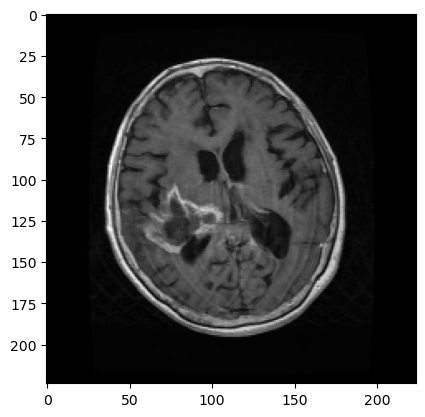

In [10]:
plt.imshow(X_grayscale[100], cmap='gray') ### PRINTING AN EXAMPLE IMAGE 

### Displaying images for each category

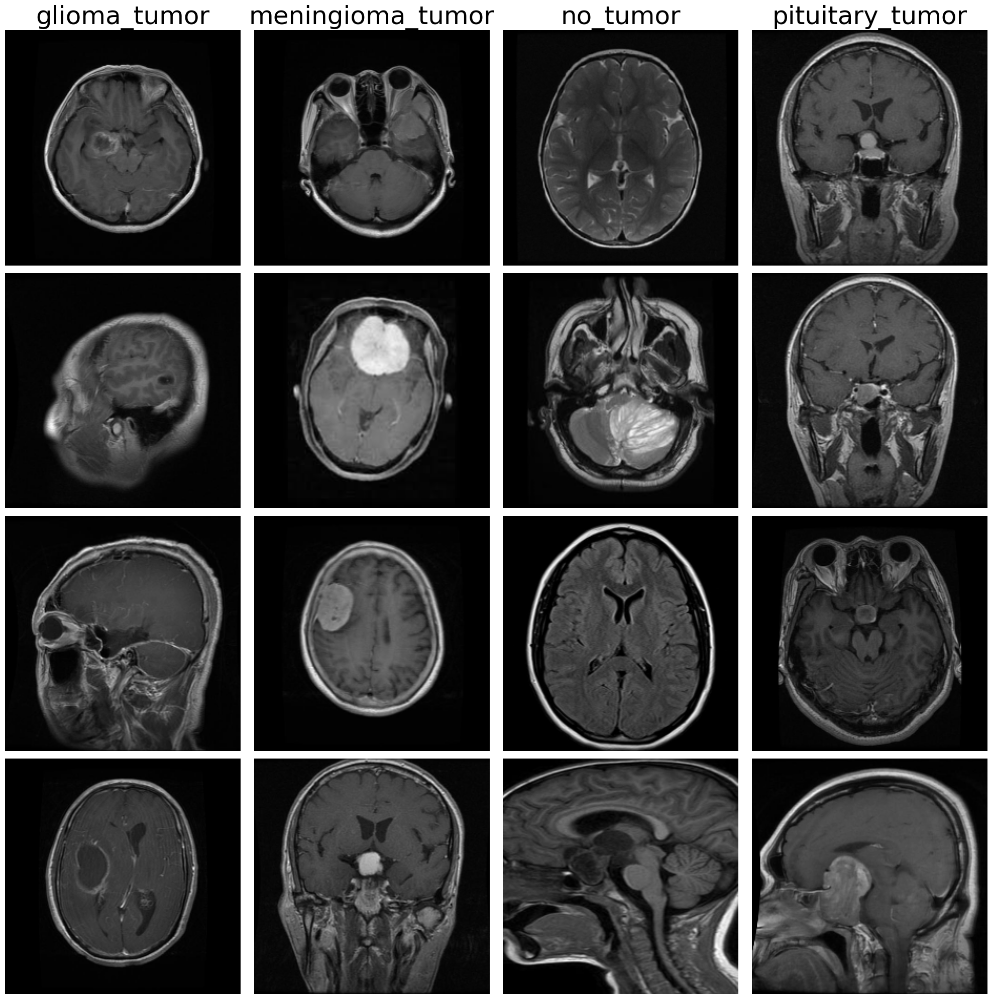

In [11]:
import matplotlib.pyplot as plt
import numpy as np
import random

def plot_label_examples(images, labels, random_seed=None):
    """
    Displays 4 random example images for each label in a subplot, with the examples
    for each label arranged vertically. Allows for setting a random seed for reproducibility.
    
    Parameters:
    - images: A list of images (each one as a numpy array).
    - labels: A list of labels corresponding to each image.
    - random_seed: An optional integer to control randomness for reproducibility.
    """
    
    if random_seed is not None:
        random.seed(random_seed) ### RANDOM SEED FOR EASIER REPRODUCING
    
    unique_labels = sorted(set(labels)) ### FINDS UNIQUE LABELS FROM DATASET
    
    fig, axs = plt.subplots(4, len(unique_labels), figsize=(5 * len(unique_labels), 20))
    
    
    if len(unique_labels) == 1:
        axs = np.array([[ax] for ax in axs])

    
    for col, label in enumerate(unique_labels): ### REPEAT FOR EVERY LABEL
        
        label_indices = [idx for idx, current_label in enumerate(labels) if current_label == label] ### FIND INDICES OF LABELS
        
        
        random.shuffle(label_indices) ### RANDOMLY SHUFFLE IMAGES
        
        
        selected_indices = label_indices[:4]
        for row, img_idx in enumerate(selected_indices):
            img = images[img_idx]
            ax = axs[row, col]
            ax.imshow(img, cmap='gray', vmin=0, vmax=255)  ### PRINT IMAGES AS GRAYSCALE, EVEN WHEN THEY ARE RGB-LIKE
            ax.axis('off')
            if row == 0:
                ax.set_title(f'{label}', fontsize=36)  ### INCREASE FONT SIZE FOR EASIER READABILITY

    plt.tight_layout()
    plt.show()


plot_label_examples(X_grayscale, y_grayscale, random_seed=42)


In [12]:
### MAKE SURE THAT THE UNIQUE LABELS ARE STILL THE SAME
np.unique(y_grayscale)

array(['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor'],
      dtype='<U16')

In [13]:
### RANDOMLY SHUFFLE IMAGES IN DATASET IN ORDER TO NOT HAVE CONSECUTIVE IMAGES WITH SAME LABEL IN TRAINING
from sklearn.utils import shuffle
X_shuffled_grayscale, y_shuffled_grayscale = shuffle(X_grayscale, y_grayscale, random_state=42) ### SHUFFLING TO RE-ORDER DATA 

print(X_shuffled_grayscale.shape)
print(y_shuffled_grayscale.shape)

(5740, 224, 224)
(5740,)


In [14]:
### SHUFFLING RGB-LIKE IMAGES
X_shuffled_rgb, y_shuffled_rgb = shuffle(X_rgb, y_rgb, random_state=42) ### SHUFFLING TO RE-ORDER DATA 

print(X_shuffled_rgb.shape)
print(y_shuffled_rgb.shape)

(5740, 224, 224, 3)
(5740,)


### Statistics of label splits

Text(0.5, 1.0, 'INITIAL LABEL SPLIT')

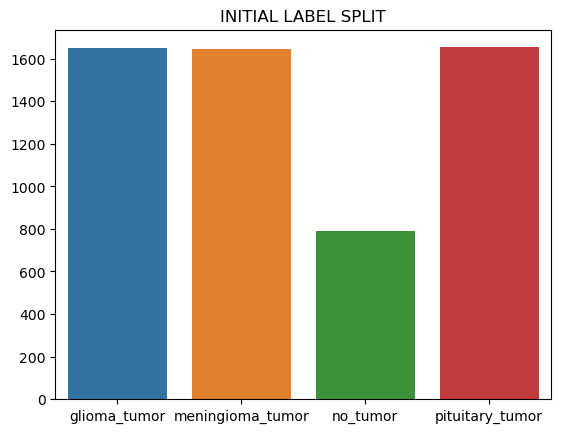

In [15]:
### VISUALIZE LABEL SPLITS IN INITIAL DATASET
import seaborn as sns

values, counts = np.unique(y_shuffled_grayscale, return_counts=True)
sns.barplot(x=values, y=counts)
plt.title('INITIAL LABEL SPLIT')

In [16]:
### FOR ALTERNATE DATA MANIPULATION, WE CAN USE THE PANDAS LIBRARY 
df = pd.DataFrame()
df['Image'] = list(X_shuffled_grayscale)
df['Label'] = list(y_shuffled_grayscale)
print(df.shape)
df.head()

(5740, 2)


,Image,Label
0,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",glioma_tumor
1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",glioma_tumor
2,"[[32, 34, 37, 38, 36, 34, 34, 35, 35, 35, 35, ...",no_tumor
3,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",glioma_tumor
4,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",glioma_tumor


In [17]:
### WE ALWAYS MAKE A DICTIONARY FROM TEXT LABELS TO INTEGER LABELS (IDS) BECAUSE MODELS EXPECT NUMERIC LABELS
label2id = {}
for index, lab in enumerate(np.unique(y_shuffled_grayscale)):
    label2id[lab] = index
    
print(label2id)   

{'glioma_tumor': 0, 'meningioma_tumor': 1, 'no_tumor': 2, 'pituitary_tumor': 3}


In [18]:
### REVERSE DICTIONARY FROM ABOVE
id2label = {0: "glioma_tumor",
           1: "meningioma_tumor",
           2: "no_tumor",
           3: "pituitary_tumor"}

print(id2label)

{0: 'glioma_tumor', 1: 'meningioma_tumor', 2: 'no_tumor', 3: 'pituitary_tumor'}


In [19]:
### FROM LIST TO NP ARRAY 
y_shuffled_categorical_grayscale = np.array([label2id[i] for i in y_shuffled_grayscale])
print(y_shuffled_categorical_grayscale.shape)

(5740,)


In [20]:
y_shuffled_categorical_rgb = np.array([label2id[i] for i in y_shuffled_rgb])
print(y_shuffled_categorical_rgb.shape)

(5740,)


### Train Val Test split

In [21]:
### TRAIN TEST VALIDATION SPLIT WITH SKLEARN AND A RANDOM STATE FOR REPRODUCIBLE RESULTS
### BIG TEST SIZE FOR MANY INSTANCES TO TEST EXPLAINABILITY LATER
from sklearn.model_selection import train_test_split

X_train_val_grayscale, X_test_grayscale, y_train_val_grayscale, y_test_grayscale = train_test_split(X_shuffled_grayscale, y_shuffled_categorical_grayscale, 
                                                                    test_size=0.2,
                                                                    random_state=42)

X_train_grayscale, X_val_grayscale, y_train_grayscale, y_val_grayscale = train_test_split(X_train_val_grayscale, y_train_val_grayscale,
                                                                 test_size = 0.25,
                                                                 random_state=42)

In [22]:
### SAME EXACT SPLIT FOR RGB IMAGES
from sklearn.model_selection import train_test_split

X_train_val_rgb, X_test_rgb, y_train_val_rgb, y_test_rgb = train_test_split(X_shuffled_rgb, y_shuffled_categorical_rgb, 
                                                                    test_size=0.2,
                                                                    random_state=42)

X_train_rgb, X_val_rgb, y_train_rgb, y_val_rgb = train_test_split(X_train_val_rgb, y_train_val_rgb,
                                                                 test_size = 0.25,
                                                                 random_state=42)

In [23]:
### FOR OVERSAMPLING WE USE THE IMBALANCED LEARN LIBRARY, AND RANDOM OVERSAMPLING OF MINORITY CLASSES
### NO SYNTHETIC DATAPOINTS IN THIS EXPERIMENT
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=42)

### Oversampling (Randomly)

In [24]:
import numpy as np
from imblearn.over_sampling import RandomOverSampler

def balance_dataset_with_imblearn(images, labels):
    """
    Balances the dataset using random oversampling from imbalanced-learn.

    Parameters:
    - images: Numpy array of images.
    - labels: Numpy array of labels corresponding to each image.

    Returns:
    - balanced_images: Numpy array containing the balanced set of images.
    - balanced_labels: Numpy array containing the corresponding labels.
    """
    
    n_samples = len(images) ### FIND HOW MANY IMAGES WE HAVE
    flat_dim = np.prod(images.shape[1:])  ### TOTAL NUMBER OF PIXELS IN EACH IMAGE
    images_reshaped = images.reshape(n_samples, flat_dim) ### RESHAPE THEM AS FLAT IMAGES FOR EASIER MANIPULATION
    
    
    ros = RandomOverSampler() ### RANDOM OVERSAMPLING
    balanced_images_reshaped, balanced_labels = ros.fit_resample(images_reshaped, labels)
    
    
    balanced_images = balanced_images_reshaped.reshape(-1, *images.shape[1:]) ### RESHAPE TO ORIGINAL SHAPE

    return balanced_images, balanced_labels


X_train_res_grayscale, y_train_res_grayscale = balance_dataset_with_imblearn(X_train_grayscale, y_train_grayscale)

X_train_res_rgb, y_train_res_rgb = balance_dataset_with_imblearn(X_train_rgb, y_train_rgb)


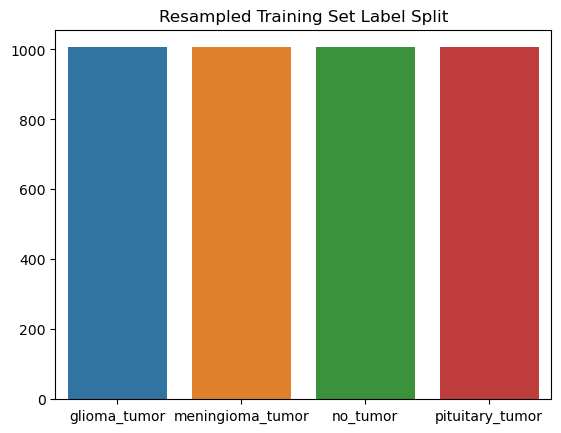

In [25]:
### VISUALIZE NEW TRAINING VALIDATION AND TEST LABEL SPLITS
### NOTICE THAT WE ONLY RESAMPLE THE TRAIN SET, NEVER THE VALIDATION AND TEST SETS!
values, counts = np.unique(y_train_res_grayscale, return_counts=True)
sns.barplot(x=values, y=counts)
plt.xticks(range(4), labels)
plt.title("Resampled Training Set Label Split")
plt.show()

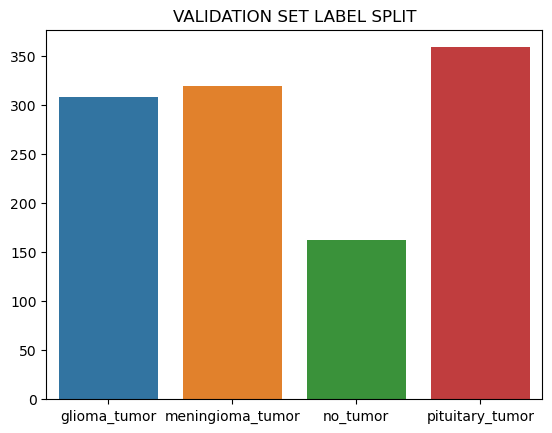

In [26]:
values, counts = np.unique(y_val_grayscale, return_counts=True)
sns.barplot(x=values, y=counts)
plt.xticks(range(4), labels)
plt.title("VALIDATION SET LABEL SPLIT")
plt.show()

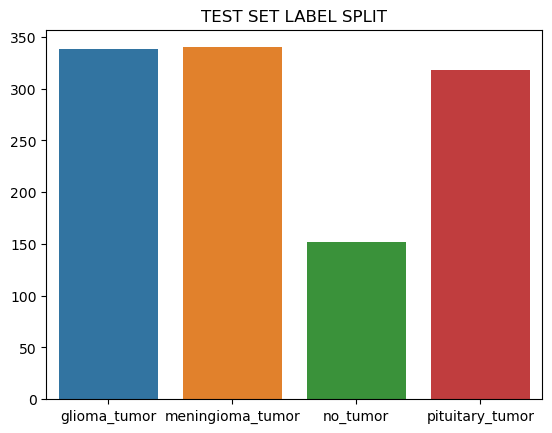

In [27]:
values, counts = np.unique(y_test_grayscale, return_counts=True)
sns.barplot(x=values, y=counts)
plt.xticks(range(4), labels)
plt.title("TEST SET LABEL SPLIT")
plt.show()

In [28]:
### PRINT NEW SHAPES OF THE TRAIN VAL TEST SETS 
print(X_train_res_grayscale.shape, y_train_res_grayscale.shape)
print(X_val_grayscale.shape, y_val_grayscale.shape)
print(X_test_grayscale.shape, y_test_grayscale.shape)

(4024, 224, 224) (4024,)
(1148, 224, 224) (1148,)
(1148, 224, 224) (1148,)


In [29]:
print(X_train_res_rgb.shape, y_train_res_rgb.shape)
print(X_val_rgb.shape, y_val_rgb.shape)
print(X_test_rgb.shape, y_test_rgb.shape)

(4024, 224, 224, 3) (4024,)
(1148, 224, 224, 3) (1148,)
(1148, 224, 224, 3) (1148,)


In [30]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

### FOR CNNS WHICH EXPECT GRAYSCALE IMAGE

class CustomImageDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        """
        Custom dataset to convert images and labels to tensors.

        Parameters:
        - images: Numpy array of images.
        - labels: Numpy array of labels corresponding to each image.
        - transform: Optional transform to be applied on a sample.
        """
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label


transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor()]) ### THIS LINE NORMALIZES THE INPUT BETWEEN [0, 1] SO NO FURTHER NEED TO NORMALIZE



In [31]:
import torch
import torchvision.transforms as transforms
import random
import numpy as np
from transformers import ViTFeatureExtractor

In [32]:
### HERE WE WORK ON THE TRANSFORMS FOR THE VISUAL TRANSFORMERS
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224')

class CustomTransformVit(object):
    def __init__(self):
        self.transform = transforms.Compose([
            transforms.RandomApply([transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1), shear=10)], p=0.5),
            transforms.ToTensor(),
            transforms.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std),
            transforms.RandomApply([transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))], p=0.5),
            transforms.RandomApply([AddGaussianNoise(0., 0.1)], p=0.5),
            transforms.RandomApply([AddSaltPepperNoise(0.02, 0.02)], p=0.5)
        ])

    def __call__(self, img):
        return self.transform(img)

class AddGaussianNoise(object):
    def __init__(self, mean=0., std=1.):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean

class AddSaltPepperNoise(object):
    def __init__(self, salt=0.02, pepper=0.02):
        self.salt = salt
        self.pepper = pepper

    def __call__(self, tensor):
        np_tensor = tensor.numpy()
        salt_pepper_noise = np.random.choice(
            [0, 1, 2], 
            size=np_tensor.shape, 
            p=[self.pepper, self.salt, 1 - self.salt - self.pepper]
        )
        np_tensor[salt_pepper_noise == 0] = 0
        np_tensor[salt_pepper_noise == 1] = 1
        return torch.from_numpy(np_tensor)

C:\Users\N\anaconda3\Lib\site-packages\transformers\models\vit\feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


In [33]:
### SAME TRANSFORMS AS ABOVE BUT WITHOUT NORMALIZING TO THE MEAN AND STD OF THE VIT

class CustomTransformCNN(object):
    def __init__(self):
        self.transform = transforms.Compose([
            transforms.RandomApply([transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1), shear=10)], p=0.5),
            transforms.ToTensor(),
            #transforms.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std),
            transforms.RandomApply([transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))], p=0.5),
            transforms.RandomApply([AddGaussianNoise(0., 0.1)], p=0.5),
            transforms.RandomApply([AddSaltPepperNoise(0.02, 0.02)], p=0.5)
        ])

    def __call__(self, img):
        return self.transform(img)

class AddGaussianNoise(object):
    def __init__(self, mean=0., std=1.):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean

class AddSaltPepperNoise(object):
    def __init__(self, salt=0.02, pepper=0.02):
        self.salt = salt
        self.pepper = pepper

    def __call__(self, tensor):
        np_tensor = tensor.numpy()
        salt_pepper_noise = np.random.choice(
            [0, 1, 2], 
            size=np_tensor.shape, 
            p=[self.pepper, self.salt, 1 - self.salt - self.pepper]
        )
        np_tensor[salt_pepper_noise == 0] = 0
        np_tensor[salt_pepper_noise == 1] = 1
        return torch.from_numpy(np_tensor)

In [34]:
### CNN NO AUG

transform_train_cnn_no_aug = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor()]) ### THIS LINE NORMALIZES THE INPUT BETWEEN [0, 1] SO NO FURTHER NEED TO NORMALIZE

transform_val_test_cnn_no_aug = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor()]) ### THIS LINE NORMALIZES THE INPUT BETWEEN [0, 1] SO NO FURTHER NEED TO NORMALIZE

In [35]:
### CNN WITH AUG
transform_train_cnn_with_aug =  transforms.Compose([
    transforms.ToPILImage(),
    transforms.Grayscale(num_output_channels=1),
    CustomTransformCNN() ### PERFORMS AUGMENTATION
])

transform_val_test_cnn_with_aug = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor()
])


In [36]:
### VIT WITH AUG

transform_train_vit_aug = transforms.Compose([
    transforms.ToPILImage(),
    CustomTransformVit() ### PERFORMS AUGMENTATION
])

transform_val_test_vit_aug = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)
])

In [37]:
### OLDER CELL THAT WAS USED FOR PREVIOUS EXPERIMENTING, NO NEED TO RUN THIS
# ### TRANSFORMS

# ### VIT TRANSFORMS INDICATE CASES IN WHICH WE TRAIN WITH RGB IMAGES (VIT, RESNET)

# ### CNN TRANSFORMS INDICATE CASES WHERE WE TRAIN ON GRAYSCALE IMAGES (CUSTOM CNNS)

# transform_train_cnn_no_aug = transforms.Compose([
#     transforms.ToPILImage(),
#     transforms.Grayscale(num_output_channels=1),
#     transforms.ToTensor()]) ### THIS LINE NORMALIZES THE INPUT BETWEEN [0, 1] SO NO FURTHER NEED TO NORMALIZE

# transform_val_test_cnn_no_aug = transforms.Compose([
#     transforms.ToPILImage(),
#     transforms.Grayscale(num_output_channels=1),
#     transforms.ToTensor()]) ### THIS LINE NORMALIZES THE INPUT BETWEEN [0, 1] SO NO FURTHER NEED TO NORMALIZE



# transform_train_vit_aug = transforms.Compose([
#     transforms.ToPILImage(),
#     #transforms.Grayscale(num_output_channels=1),
#     CustomTransform() ### PERFORMS AUGMENTATION
# ])

# transform_val_test_vit = transforms.Compose([
#     transforms.ToPILImage(),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)
#     #transforms.Grayscale(num_output_channels=1),
# ])


# transform_train_cnn_aug = transforms.Compose([
#     transforms.ToPILImage(),
#     transforms.Grayscale(num_output_channels=1),
#     CustomTransform() ### PERFORMS AUGMENTATION
# ])

# transform_val_test_cnn = transforms.Compose([
#     transforms.ToPILImage(),
#     transforms.ToTensor(),
#     #transforms.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std),
#     transforms.Grayscale(num_output_channels=1),
# ])

### Dataset and dataloader creation

In [38]:
 ### SETTING X_train_res INSTEAD OF X_train USES THE RESAMPLED TRAIN SET BELOW

### Grayscale images, no augment

In [39]:
batch_size = 128 ### ADJUST BASED ON AVAILABLE VRAM


train_dataset_grayscale_no_aug = CustomImageDataset(X_train_grayscale, y_train_grayscale, transform=transform)
train_dataloader_grayscale_no_aug = DataLoader(train_dataset_grayscale_no_aug, batch_size=batch_size, shuffle=True)
print(f'LENGTH OF TRAIN DATASET:{len(train_dataset_grayscale_no_aug)}')
print(f'LENGTH OF TRAIN DATALOADER:{len(train_dataloader_grayscale_no_aug)}')

val_dataset_grayscale_no_aug = CustomImageDataset(X_val_grayscale, y_val_grayscale, transform=transform)
val_dataloader_grayscale_no_aug = DataLoader(val_dataset_grayscale_no_aug, batch_size=batch_size, shuffle=False)
print(f'LENGTH OF VALIDATION DATASET:{len(val_dataset_grayscale_no_aug)}')
print(f'LENGTH OF VALIDATION DATALOADER:{len(val_dataloader_grayscale_no_aug)}')

test_dataset_grayscale_no_aug = CustomImageDataset(X_test_grayscale, y_test_grayscale, transform=transform)
test_dataloader_grayscale_no_aug = DataLoader(test_dataset_grayscale_no_aug, batch_size=batch_size, shuffle=False)
print(f'LENGTH OF TEST DATASET:{len(test_dataset_grayscale_no_aug)}')
print(f'LENGTH OF TEST DATALOADER:{len(test_dataloader_grayscale_no_aug)}')

LENGTH OF TRAIN DATASET:3444
LENGTH OF TRAIN DATALOADER:27
LENGTH OF VALIDATION DATASET:1148
LENGTH OF VALIDATION DATALOADER:9
LENGTH OF TEST DATASET:1148
LENGTH OF TEST DATALOADER:9


### Grayscale images, with augment

In [40]:
batch_size = 128 ### ADJUST BASED ON AVAILABLE VRAM


train_dataset_grayscale_with_aug = CustomImageDataset(X_train_res_grayscale, y_train_res_grayscale, transform=transform_train_cnn_with_aug)
train_dataloader_grayscale_with_aug = DataLoader(train_dataset_grayscale_with_aug, batch_size=batch_size, shuffle=True)
print(f'LENGTH OF TRAIN DATASET:{len(train_dataset_grayscale_with_aug)}')
print(f'LENGTH OF TRAIN DATALOADER:{len(train_dataloader_grayscale_with_aug)}')

val_dataset_grayscale_with_aug = CustomImageDataset(X_val_grayscale, y_val_grayscale, transform=transform_val_test_cnn_with_aug)
val_dataloader_grayscale_with_aug = DataLoader(val_dataset_grayscale_with_aug, batch_size=batch_size, shuffle=False)
print(f'LENGTH OF VALIDATION DATASET:{len(val_dataset_grayscale_with_aug)}')
print(f'LENGTH OF VALIDATION DATALOADER:{len(val_dataloader_grayscale_with_aug)}')

test_dataset_grayscale_with_aug = CustomImageDataset(X_test_grayscale, y_test_grayscale, transform=transform_val_test_cnn_with_aug)
test_dataloader_grayscale_with_aug = DataLoader(test_dataset_grayscale_with_aug, batch_size=batch_size, shuffle=False)
print(f'LENGTH OF TEST DATASET:{len(test_dataset_grayscale_with_aug)}')
print(f'LENGTH OF TEST DATALOADER:{len(test_dataloader_grayscale_with_aug)}')

LENGTH OF TRAIN DATASET:4024
LENGTH OF TRAIN DATALOADER:32
LENGTH OF VALIDATION DATASET:1148
LENGTH OF VALIDATION DATALOADER:9
LENGTH OF TEST DATASET:1148
LENGTH OF TEST DATALOADER:9


### RGB images, with augment

In [41]:
batch_size = 32 ### ADJUST BASED ON AVAILABLE VRAM


train_dataset_rgb_with_aug = CustomImageDataset(X_train_res_rgb, y_train_res_rgb, transform=transform_train_vit_aug)
train_dataloader_rgb_with_aug = DataLoader(train_dataset_rgb_with_aug, batch_size=batch_size, shuffle=True)
print(f'LENGTH OF TRAIN DATASET:{len(train_dataset_rgb_with_aug)}')
print(f'LENGTH OF TRAIN DATALOADER:{len(train_dataset_rgb_with_aug)}')

val_dataset_rgb_with_aug = CustomImageDataset(X_val_rgb, y_val_rgb, transform=transform_val_test_vit_aug)
val_dataloader_rgb_with_aug = DataLoader(val_dataset_rgb_with_aug, batch_size=batch_size, shuffle=False)
print(f'LENGTH OF VALIDATION DATASET:{len(val_dataset_rgb_with_aug)}')
print(f'LENGTH OF VALIDATION DATALOADER:{len(val_dataloader_rgb_with_aug)}')

test_dataset_rgb_with_aug = CustomImageDataset(X_test_rgb, y_test_rgb, transform=transform_val_test_vit_aug)
test_dataloader_rgb_with_aug = DataLoader(test_dataset_rgb_with_aug, batch_size=batch_size, shuffle=False)
print(f'LENGTH OF TEST DATASET:{len(test_dataset_rgb_with_aug)}')
print(f'LENGTH OF TEST DATALOADER:{len(test_dataloader_rgb_with_aug)}')

LENGTH OF TRAIN DATASET:4024
LENGTH OF TRAIN DATALOADER:4024
LENGTH OF VALIDATION DATASET:1148
LENGTH OF VALIDATION DATALOADER:36
LENGTH OF TEST DATASET:1148
LENGTH OF TEST DATALOADER:36


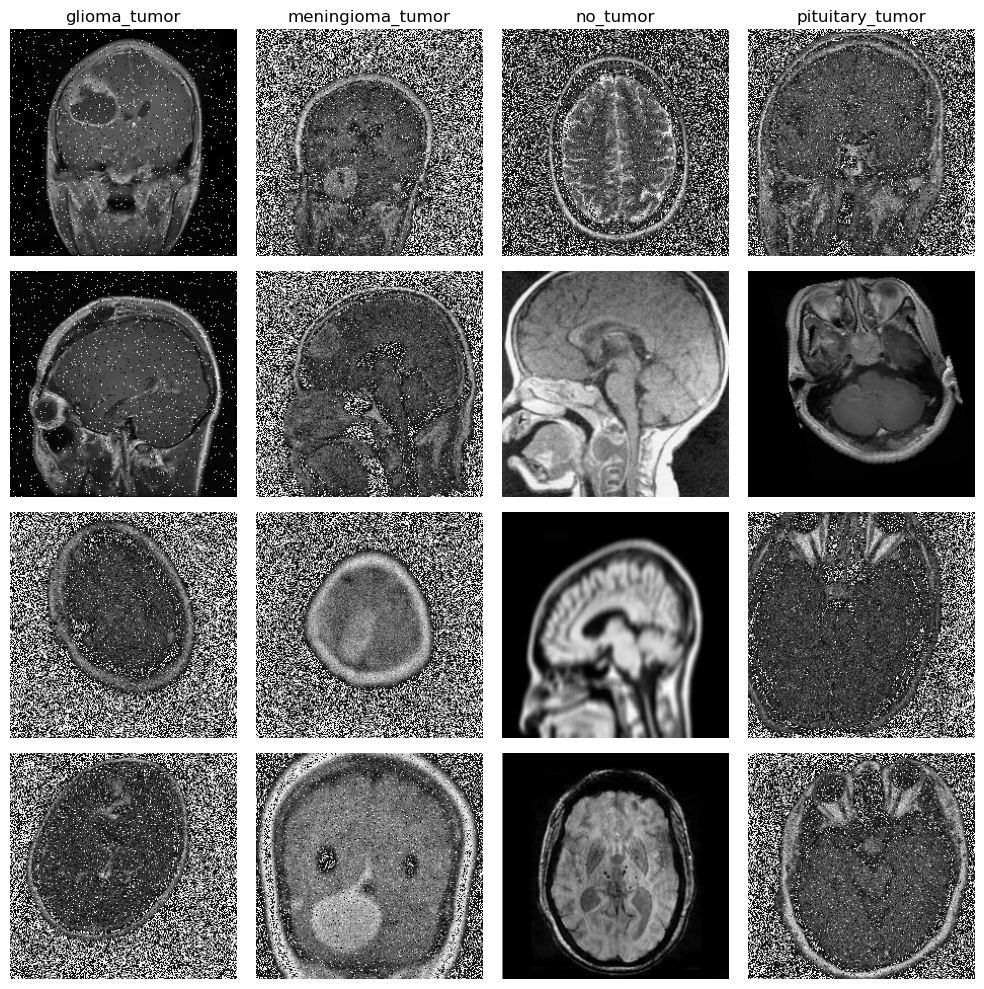

In [42]:
### PRINT 4 RANDOM IMAGES FROM THE AUGMENTED TRAIN SET, TO BETTER VISUALIZE THE AUGMENTATIONS
import random
import matplotlib.pyplot as plt
from torchvision.transforms import ToPILImage


dataset = train_dataset_grayscale_with_aug ### CUSTOM IMAGE DATASET FROM BEFORE


images_by_label = {label: [] for label in range(4)} ### GROUPING IMAGES WITH SAME LABEL
for i in range(len(dataset)):
    _, label = dataset[i]
    images_by_label[label].append(i)


selected_indices = {label: random.sample(images_by_label[label], 4) for label in range(4)}


to_pil = ToPILImage()


fig, axes = plt.subplots(4, 4, figsize=(10, 10))

for label in range(4):
    for row in range(4):
        idx = selected_indices[label][row]
        image, _ = dataset[idx]
        image = to_pil(image)
        axes[row, label].imshow(image, cmap='gray')
        axes[row, label].axis('off')


for label, ax in enumerate(axes[0]):
    ax.set_title(f"{id2label[label]}") ### COMMON TITLES FOR EACH COLUMN, SINCE THEY BELONG TO THE SAME LABEL

plt.tight_layout()
plt.show()


### Model Architectures

In [43]:
### PRINTS COUNT OF TRAINABLE PARAMETERS IN MODEL, IN PYTORCH
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad) ### TRAINABLE PARAMETER = REQUIRES GRAD

In [44]:
import torch.nn as nn
import torch.nn.functional as F
### SIMPLE CNN ARCHITECTURE = 2 CONVOLUTIONS AND 2 FULLY CONNECTED LAYERS, EXPECTS GRAYSCALE IMAGE INPUT

class SimpleCNN(nn.Module):
    def __init__(self, num_classes=4):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)  ### EXPECTS GRAYSCALE IMAGES AS INPUT
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(64 * 56 * 56, 128)  
        self.fc2 = nn.Linear(128, num_classes) ### 4 CLASSES IN OUR DATA

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 64 * 56 * 56)  
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [45]:
import torch
import torch.nn as nn
import torch.nn.functional as F
### THIS CUSTOM CNN WAS USED FOR EARLY EXPERIMENTATION, BUT IS NOT SHOWN IN THE RESULTS

class CustomCNN(nn.Module):
    def __init__(self):
        super(CustomCNN, self).__init__()
        
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        
        
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        
        
        self.fc1 = nn.Linear(256 * 14 * 14, 512)
        self.fc2 = nn.Linear(512, 128)
        self.fc3 = nn.Linear(128, 4)  
        
        
        self.dropout = nn.Dropout(0.5)
        
    def forward(self, x):
        
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = self.pool(F.relu(self.conv4(x)))
        
        
        x = x.view(-1, 256 * 14 * 14)
        
        
        x = self.dropout(x)
        
        x = F.relu(self.fc1(x))
        
        x = self.dropout(x)
        
        x = F.relu(self.fc2(x))
        
        x = self.dropout(x)
        
        x = self.fc3(x)
        return x

In [46]:
import torch
import torch.nn as nn
import torch.nn.functional as F

### THIS IS THE 5 LAYER CUSTOM CNN THAT WAS USED IN THE EXPERIMENTS 
class CustomCNN5(nn.Module):
    def __init__(self):
        super(CustomCNN5, self).__init__()
        
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1) ### EXPECTS GRAYSCALE IMAGES AS INPUT
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, padding=1)  ### 5 CONVOLUTIONS IN TOTAL
        self.act = nn.ReLU()
        
        
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        
        self.fc1 = nn.Linear(512 * 7 * 7, 512)  
        self.fc2 = nn.Linear(512, 128)
        self.fc3 = nn.Linear(128, 4)  
        
        self.dropout = nn.Dropout(0.5)
        
    def layer4(self, x):
        x = self.pool(self.act(self.conv1(x)))
        x = self.pool(self.act(self.conv2(x)))
        x = self.pool(self.act(self.conv3(x)))
        x = self.pool(self.act(self.conv4(x)))
        #x = self.pool(self.act(self.conv5(x)))  ### FOR LATER VISUALIZATIONS
        return x
        
    
    def forward(self, x):
        x = self.pool(self.act(self.conv1(x)))
        x = self.pool(self.act(self.conv2(x)))
        x = self.pool(self.act(self.conv3(x)))
        x = self.pool(self.act(self.conv4(x)))
        x = self.pool(self.act(self.conv5(x)))  
        
        
        x = x.view(-1, 512 * 7 * 7)  
        
        x = self.dropout(x)
        
        x = F.relu(self.fc1(x))
        
        x = self.dropout(x)
        
        x = F.relu(self.fc2(x))
        
        x = self.dropout(x)
        
        x = self.fc3(x)
        return x

# TRAINING MODELS

In [43]:
### THE BELOW CELLS CONTAIN THE ACTUAL TRAINING OF ALL MODELS
### AFTER EVERY RUN, THE BEST PERFORMING MODEL IS SAVED LOCALLY
### ONLY RUN THE FOLLOWING CELLS IF YOU INTEND TO TRAIN THE MODELS!

### SIMPLE 2 LAYER CNN, NO AUGMENT, NO RESAMPLE

In [181]:
model = SimpleCNN()
print(model)
print(f"Number of trainable parameters: {count_parameters(model):,}")

SimpleCNN(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=200704, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=4, bias=True)
)
Number of trainable parameters: 25,709,572


In [32]:
import torch.optim as optim
from tqdm import tqdm
from sklearn.model_selection import train_test_split

MODEL_PATH = 'RESULTS/SIMPLE_CNN_NO_RESAMPLE_NO_AUGMENT.pth'
OPTIMIZER_PATH = 'RESULTS/SIMPLE_CNN_NO_RESAMPLE_NO_AUGMENT_OPTIMIZER.pth'


criterion = nn.CrossEntropyLoss() ### CROSS ENTROPY FOR LOSS FUNCTION
optimizer = optim.AdamW(model.parameters(), lr=0.0001) ### LEARNING RATE PICKED AFTER MANY EXPERIMENTS

device = torch.device("cuda" if torch.cuda.is_available() else "cpu") ### TRAIN ON GPU IF AVAILABLE
model.to(device)
train_losses = []
val_losses = []
no_improve_epochs = 0
min_val_loss = float('inf')

num_epochs = 20 ### TOTAL TRAIN EPOCHS 
early_stopping_criteria = 3 ### STOP TRAINING IF VALIDATION LOSS DOES NOT DECREASE AFTER THIS MANY EPOCHS

### TRAINING LOOP
for epoch in range(num_epochs):
    model.train() ### SET MODEL FOR TRAINING
    running_loss = 0.0 ### ZERO TRAIN LOSS FOR EACH BATCH
    for images, labels in tqdm(train_dataloader_grayscale_no_aug, desc=f"Epoch {epoch+1}/{num_epochs}", unit='batch'):
        images, labels = images.to(device), labels.to(device) ### MOVE TO DEVICE

        optimizer.zero_grad() ### ZERO THE OPTIMIZER GRADS

        outputs = model(images) ### PASS THE BATCH FORWARD THROUGH THE MODEL
        loss = criterion(outputs, labels.long()) ### CALCULATE LOSS FUNCTION
        loss.backward() ### COMPUTE GRAPH
        optimizer.step() ### UPDATE WEIGHTS

        running_loss += loss.item() * images.size(0) ### UPDATE RUNNING LOSS

    epoch_loss = running_loss / len(train_dataloader_grayscale_no_aug.dataset) ### AVERAGE TRAIN LOSS
    train_losses.append(epoch_loss) ### KEEP TRACK OF TRIAN LOSSES
    print(f"Training Loss: {epoch_loss:.4f}")

    ### VALIDATION LOOP
    model.eval() ### WE DO NOT NEED GRADIENS IN VALIDATION LOOP
    with torch.no_grad():
        val_running_loss = 0.0
        for images, labels in tqdm(val_dataloader_grayscale_no_aug):
            images, labels = images.to(device), labels.to(device) ### MOVE TO DEVICE

            outputs = model(images) ### FORWARD 
            loss = criterion(outputs, labels.long()) ### LOSS CALCULATION

            val_running_loss += loss.item() * images.size(0) ### UPDATE VALIDATION RUNNING LOSS

        val_epoch_loss = val_running_loss / len(val_dataloader_grayscale_no_aug.dataset) ### AVERAGE VALIDATION LOSS
        val_losses.append(val_epoch_loss)

        print(f"Validation Loss: {val_epoch_loss:.4f}")
        
        if val_epoch_loss < min_val_loss: ### CURRENT MODEL IS BETTER THAN THE BEST ONE SAVED UNTIL NOW
            min_val_loss = val_epoch_loss
            no_improve_epochs = 0
            torch.save(model.state_dict(), MODEL_PATH) ### SAVE MODEL DICT
            torch.save(optimizer.state_dict(), OPTIMIZER_PATH) ### SAVE OPTIMIZER DICT, IN CASE WE WANT TO CONTINUE TRAINING AFTER 20 EPOCHS
            print('SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW') ### WE SAVE OPTIMIZER DICT TO KEEP THE MOMENTUMS OF EACH WEIGHT
            ### OPTIMIZER SAVING TAKES MORE SPACE THAN MODEL ITSELF, SO IF SPACE IS LIMITED, COMMENT THE LINE ABOVE
            
        else:
            no_improve_epochs += 1 
    
        if no_improve_epochs >= early_stopping_criteria:
            print(f"Stopping early at epoch {epoch+1} due to no improvement in validation loss.")
            break    


Epoch 1/20: 100%|██████████| 27/27 [00:04<00:00,  5.48batch/s]


Training Loss: 1.1521


100%|██████████| 9/9 [00:00<00:00, 12.49it/s]


Validation Loss: 0.9949
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 2/20: 100%|██████████| 27/27 [00:04<00:00,  6.53batch/s]


Training Loss: 0.8137


100%|██████████| 9/9 [00:00<00:00, 13.73it/s]


Validation Loss: 0.7699
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 3/20: 100%|██████████| 27/27 [00:04<00:00,  6.51batch/s]


Training Loss: 0.6510


100%|██████████| 9/9 [00:00<00:00, 13.71it/s]


Validation Loss: 0.6443
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 4/20: 100%|██████████| 27/27 [00:04<00:00,  6.50batch/s]


Training Loss: 0.5369


100%|██████████| 9/9 [00:00<00:00, 13.71it/s]


Validation Loss: 0.5585
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 5/20: 100%|██████████| 27/27 [00:04<00:00,  6.67batch/s]


Training Loss: 0.4854


100%|██████████| 9/9 [00:00<00:00, 14.44it/s]


Validation Loss: 0.5063
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 6/20: 100%|██████████| 27/27 [00:04<00:00,  6.63batch/s]


Training Loss: 0.4125


100%|██████████| 9/9 [00:00<00:00, 13.98it/s]


Validation Loss: 0.4650
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 7/20: 100%|██████████| 27/27 [00:04<00:00,  6.64batch/s]


Training Loss: 0.3625


100%|██████████| 9/9 [00:00<00:00, 14.49it/s]


Validation Loss: 0.4160
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 8/20: 100%|██████████| 27/27 [00:04<00:00,  6.62batch/s]


Training Loss: 0.3244


100%|██████████| 9/9 [00:00<00:00, 13.75it/s]


Validation Loss: 0.3964
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 9/20: 100%|██████████| 27/27 [00:04<00:00,  6.54batch/s]


Training Loss: 0.2882


100%|██████████| 9/9 [00:00<00:00, 14.27it/s]


Validation Loss: 0.3752
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 10/20: 100%|██████████| 27/27 [00:04<00:00,  6.56batch/s]


Training Loss: 0.2527


100%|██████████| 9/9 [00:00<00:00, 13.79it/s]


Validation Loss: 0.3357
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 11/20: 100%|██████████| 27/27 [00:04<00:00,  6.59batch/s]


Training Loss: 0.2318


100%|██████████| 9/9 [00:00<00:00, 14.25it/s]


Validation Loss: 0.3814


Epoch 12/20: 100%|██████████| 27/27 [00:04<00:00,  6.59batch/s]


Training Loss: 0.2057


100%|██████████| 9/9 [00:00<00:00, 14.39it/s]


Validation Loss: 0.2778
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 13/20: 100%|██████████| 27/27 [00:04<00:00,  6.45batch/s]


Training Loss: 0.1845


100%|██████████| 9/9 [00:00<00:00, 13.54it/s]


Validation Loss: 0.2629
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 14/20: 100%|██████████| 27/27 [00:04<00:00,  6.53batch/s]


Training Loss: 0.1512


100%|██████████| 9/9 [00:00<00:00, 13.69it/s]


Validation Loss: 0.2420
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 15/20: 100%|██████████| 27/27 [00:04<00:00,  6.52batch/s]


Training Loss: 0.1403


100%|██████████| 9/9 [00:00<00:00, 14.03it/s]


Validation Loss: 0.2405
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 16/20: 100%|██████████| 27/27 [00:04<00:00,  6.60batch/s]


Training Loss: 0.1214


100%|██████████| 9/9 [00:00<00:00, 14.35it/s]


Validation Loss: 0.2223
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 17/20: 100%|██████████| 27/27 [00:04<00:00,  6.49batch/s]


Training Loss: 0.1069


100%|██████████| 9/9 [00:00<00:00, 13.69it/s]


Validation Loss: 0.2166
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 18/20: 100%|██████████| 27/27 [00:04<00:00,  6.41batch/s]


Training Loss: 0.0897


100%|██████████| 9/9 [00:00<00:00, 14.04it/s]


Validation Loss: 0.2125
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 19/20: 100%|██████████| 27/27 [00:04<00:00,  6.56batch/s]


Training Loss: 0.0808


100%|██████████| 9/9 [00:00<00:00, 14.70it/s]


Validation Loss: 0.2223


Epoch 20/20: 100%|██████████| 27/27 [00:04<00:00,  6.53batch/s]


Training Loss: 0.0748


100%|██████████| 9/9 [00:00<00:00, 14.11it/s]


Validation Loss: 0.1840
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


In [34]:
from sklearn.metrics import classification_report

true_labels = []
pred_labels = []
labels_list = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor'] ### ORIGINAL LABELS FROM DATASET

model.eval()
### TESTING LOOP
with torch.no_grad():
    for images, labels in tqdm(test_dataloader_grayscale_no_aug):
        images, labels = images.to(device), labels.to(device) ### MOVE TO DEVICE

        
        outputs = model(images) ### FORWARD
        
        
        _, predicted = torch.max(outputs.data, 1) ### GET THE ACTUAL PREDICTIONS

        ### KEEP TRACK OF PREDICTIONS AND ACTUAL LABELS FOR FURTHER METRIC COMPUTATION
        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(predicted.cpu().numpy())


100%|██████████| 9/9 [00:01<00:00,  8.14it/s]


In [35]:
### CLASSIFICATION REPORT WITH SKLEARN
report = classification_report(true_labels, pred_labels, target_names=labels_list)

print(report)

                  precision    recall  f1-score   support

    glioma_tumor       0.94      0.91      0.93       338
meningioma_tumor       0.89      0.93      0.91       340
        no_tumor       0.95      0.93      0.94       152
 pituitary_tumor       1.00      0.99      1.00       318

        accuracy                           0.94      1148
       macro avg       0.95      0.94      0.94      1148
    weighted avg       0.94      0.94      0.94      1148



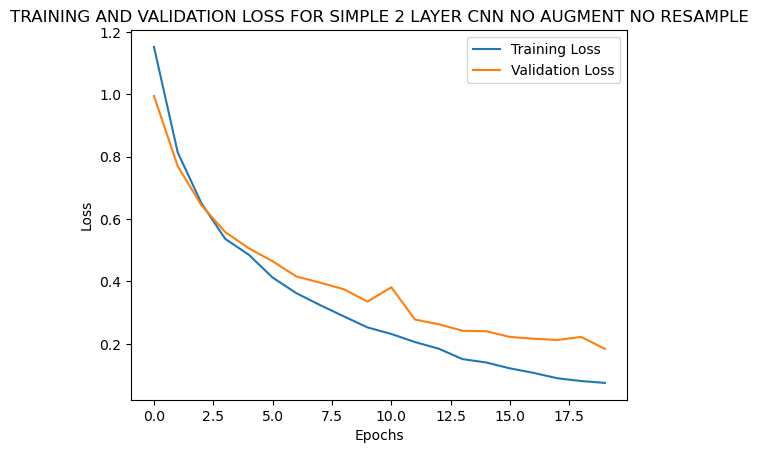

In [36]:
### PLOTTING THE TRAINING AND VALIDATION LOSSES
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('TRAINING AND VALIDATION LOSS FOR SIMPLE 2 LAYER CNN NO AUGMENT NO RESAMPLE')
plt.show()

### SIMPLE 2 LAYER CNN, WITH AUGMENT AND RESAMPLE

In [36]:
model = SimpleCNN()
print(model)
print(f"Number of trainable parameters: {count_parameters(model):,}")

SimpleCNN(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=200704, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=4, bias=True)
)
Number of trainable parameters: 25,709,572


In [37]:
import torch.optim as optim
from tqdm import tqdm
from sklearn.model_selection import train_test_split

MODEL_PATH = 'RESULTS/SIMPLE_CNN_WITH_RESAMPLE_WITH_AUGMENT.pth'
OPTIMIZER_PATH = 'RESULTS/SIMPLE_CNN_WITH_RESAMPLE_WITH_AUGMENT_OPTIMIZER.pth'

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.0001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
train_losses = []
val_losses = []
no_improve_epochs = 0
min_val_loss = float('inf')

num_epochs = 20
early_stopping_criteria = 3

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(train_dataloader_grayscale_with_aug, desc=f"Epoch {epoch+1}/{num_epochs}", unit='batch'):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels.long())
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(train_dataloader_grayscale_with_aug.dataset)
    train_losses.append(epoch_loss)
    print(f"Training Loss: {epoch_loss:.4f}")

    model.eval()
    with torch.no_grad():
        val_running_loss = 0.0
        for images, labels in tqdm(val_dataloader_grayscale_with_aug):
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels.long())

            val_running_loss += loss.item() * images.size(0)

        val_epoch_loss = val_running_loss / len(val_dataloader_grayscale_with_aug.dataset)
        val_losses.append(val_epoch_loss)

        print(f"Validation Loss: {val_epoch_loss:.4f}")
        
        if val_epoch_loss < min_val_loss:
            min_val_loss = val_epoch_loss
            no_improve_epochs = 0
            torch.save(model.state_dict(), MODEL_PATH)
            torch.save(optimizer.state_dict(), OPTIMIZER_PATH)
            print('SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW')
                
        else:
            no_improve_epochs += 1
    
        if no_improve_epochs >= early_stopping_criteria:
            print(f"Stopping early at epoch {epoch+1} due to no improvement in validation loss.")
            break    


Epoch 1/20: 100%|██████████| 32/32 [00:11<00:00,  2.74batch/s]


Training Loss: 1.3488


100%|██████████| 9/9 [00:00<00:00, 13.83it/s]


Validation Loss: 1.2038
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 2/20: 100%|██████████| 32/32 [00:10<00:00,  2.98batch/s]


Training Loss: 1.1204


100%|██████████| 9/9 [00:00<00:00, 13.85it/s]


Validation Loss: 1.0023
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 3/20: 100%|██████████| 32/32 [00:10<00:00,  3.00batch/s]


Training Loss: 0.9886


100%|██████████| 9/9 [00:00<00:00, 13.73it/s]


Validation Loss: 0.9653
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 4/20: 100%|██████████| 32/32 [00:10<00:00,  3.03batch/s]


Training Loss: 0.9315


100%|██████████| 9/9 [00:00<00:00, 13.69it/s]


Validation Loss: 0.8176
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 5/20: 100%|██████████| 32/32 [00:10<00:00,  2.97batch/s]


Training Loss: 0.8840


100%|██████████| 9/9 [00:00<00:00, 13.22it/s]


Validation Loss: 0.8373


Epoch 6/20: 100%|██████████| 32/32 [00:10<00:00,  2.96batch/s]


Training Loss: 0.8227


100%|██████████| 9/9 [00:00<00:00, 13.33it/s]


Validation Loss: 0.7097
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 7/20: 100%|██████████| 32/32 [00:10<00:00,  3.05batch/s]


Training Loss: 0.8093


100%|██████████| 9/9 [00:00<00:00, 13.69it/s]


Validation Loss: 0.7311


Epoch 8/20: 100%|██████████| 32/32 [00:10<00:00,  2.99batch/s]


Training Loss: 0.7941


100%|██████████| 9/9 [00:00<00:00, 13.14it/s]


Validation Loss: 0.6691
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 9/20: 100%|██████████| 32/32 [00:10<00:00,  3.02batch/s]


Training Loss: 0.7575


100%|██████████| 9/9 [00:00<00:00, 13.91it/s]


Validation Loss: 0.6559
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 10/20: 100%|██████████| 32/32 [00:10<00:00,  2.96batch/s]


Training Loss: 0.7350


100%|██████████| 9/9 [00:00<00:00, 13.48it/s]


Validation Loss: 0.6280
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 11/20: 100%|██████████| 32/32 [00:10<00:00,  3.04batch/s]


Training Loss: 0.7120


100%|██████████| 9/9 [00:00<00:00, 14.10it/s]


Validation Loss: 0.5854
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 12/20: 100%|██████████| 32/32 [00:10<00:00,  2.98batch/s]


Training Loss: 0.7070


100%|██████████| 9/9 [00:00<00:00, 13.65it/s]


Validation Loss: 0.5794
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 13/20: 100%|██████████| 32/32 [00:10<00:00,  2.98batch/s]


Training Loss: 0.6774


100%|██████████| 9/9 [00:00<00:00, 14.17it/s]


Validation Loss: 0.5666
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 14/20: 100%|██████████| 32/32 [00:10<00:00,  3.02batch/s]


Training Loss: 0.6813


100%|██████████| 9/9 [00:00<00:00, 13.89it/s]


Validation Loss: 0.5519
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 15/20: 100%|██████████| 32/32 [00:10<00:00,  2.98batch/s]


Training Loss: 0.6727


100%|██████████| 9/9 [00:00<00:00, 13.74it/s]


Validation Loss: 0.5788


Epoch 16/20: 100%|██████████| 32/32 [00:10<00:00,  2.97batch/s]


Training Loss: 0.6473


100%|██████████| 9/9 [00:00<00:00, 13.58it/s]


Validation Loss: 0.5094
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 17/20: 100%|██████████| 32/32 [00:10<00:00,  2.93batch/s]


Training Loss: 0.6297


100%|██████████| 9/9 [00:00<00:00, 13.48it/s]


Validation Loss: 0.5297


Epoch 18/20: 100%|██████████| 32/32 [00:10<00:00,  2.96batch/s]


Training Loss: 0.6190


100%|██████████| 9/9 [00:00<00:00, 13.73it/s]


Validation Loss: 0.4928
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 19/20: 100%|██████████| 32/32 [00:10<00:00,  3.02batch/s]


Training Loss: 0.5972


100%|██████████| 9/9 [00:00<00:00, 13.74it/s]


Validation Loss: 0.4997


Epoch 20/20: 100%|██████████| 32/32 [00:10<00:00,  3.05batch/s]


Training Loss: 0.6418


100%|██████████| 9/9 [00:00<00:00, 13.97it/s]


Validation Loss: 0.4734
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


In [38]:
from sklearn.metrics import classification_report

true_labels = []
pred_labels = []
labels_list = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor'] ### ORIGINAL LABELS FROM DATASET

model.eval()
with torch.no_grad():
    for images, labels in tqdm(test_dataloader_grayscale_with_aug):
        images, labels = images.to(device), labels.to(device)

        outputs = model(images)
        
        _, predicted = torch.max(outputs.data, 1)

        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(predicted.cpu().numpy())


100%|██████████| 9/9 [00:01<00:00,  8.47it/s]


In [39]:
report = classification_report(true_labels, pred_labels, target_names=labels_list)

print(report)

                  precision    recall  f1-score   support

    glioma_tumor       0.82      0.82      0.82       338
meningioma_tumor       0.75      0.74      0.74       340
        no_tumor       0.79      0.86      0.83       152
 pituitary_tumor       0.95      0.92      0.93       318

        accuracy                           0.83      1148
       macro avg       0.83      0.83      0.83      1148
    weighted avg       0.83      0.83      0.83      1148



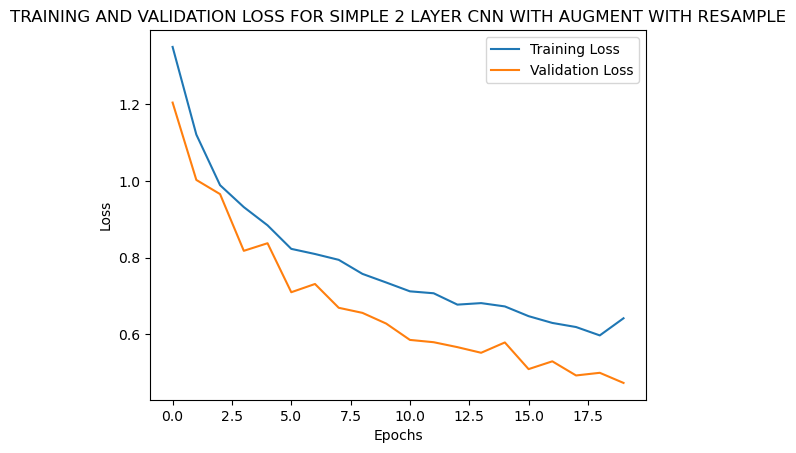

In [40]:
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('TRAINING AND VALIDATION LOSS FOR SIMPLE 2 LAYER CNN WITH AUGMENT WITH RESAMPLE')
plt.show()

### 5 LAYER CNN NO AUGMENT NO RESAMPLE

In [34]:
model = CustomCNN5()
print(model)
print(f"Number of trainable parameters: {count_parameters(model):,}")

CustomCNN5(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act): ReLU()
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=25088, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=4, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)
Number of trainable parameters: 14,479,748


In [35]:
import torch.optim as optim
from tqdm import tqdm
from sklearn.model_selection import train_test_split

MODEL_PATH = 'RESULTS/CUSTOM_5_LAYER_CNN_NO_RESAMPLE_NO_AUGMENT.pth'
OPTIMIZER_PATH = 'RESULTS/CUSTOM_5_LAYER_CNN_NO_RESAMPLE_NO_AUGMENT_OPTIMIZER.pth'

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.0001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
train_losses = []
val_losses = []
no_improve_epochs = 0
min_val_loss = float('inf')

num_epochs = 40
early_stopping_criteria = 3

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(train_dataloader_grayscale_no_aug, desc=f"Epoch {epoch+1}/{num_epochs}", unit='batch'):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels.long())
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(train_dataloader_grayscale_no_aug.dataset)
    train_losses.append(epoch_loss)
    print(f"Training Loss: {epoch_loss:.4f}")

    model.eval()
    with torch.no_grad():
        val_running_loss = 0.0
        for images, labels in tqdm(val_dataloader_grayscale_no_aug):
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels.long())

            val_running_loss += loss.item() * images.size(0)

        val_epoch_loss = val_running_loss / len(val_dataloader_grayscale_no_aug.dataset)
        val_losses.append(val_epoch_loss)

        print(f"Validation Loss: {val_epoch_loss:.4f}")
        
        if val_epoch_loss < min_val_loss:
            min_val_loss = val_epoch_loss
            no_improve_epochs = 0
            torch.save(model.state_dict(), MODEL_PATH)
            torch.save(optimizer.state_dict(), OPTIMIZER_PATH)
            print('SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW')
                
        else:
            no_improve_epochs += 1
    
        if no_improve_epochs >= early_stopping_criteria:
            print(f"Stopping early at epoch {epoch+1} due to no improvement in validation loss.")
            break    


Epoch 1/40: 100%|██████████| 27/27 [00:06<00:00,  4.22batch/s]


Training Loss: 1.3657


100%|██████████| 9/9 [00:00<00:00, 10.17it/s]


Validation Loss: 1.3536
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 2/40: 100%|██████████| 27/27 [00:05<00:00,  4.54batch/s]


Training Loss: 1.2962


100%|██████████| 9/9 [00:00<00:00, 10.35it/s]


Validation Loss: 1.1672
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 3/40: 100%|██████████| 27/27 [00:05<00:00,  4.54batch/s]


Training Loss: 1.0896


100%|██████████| 9/9 [00:00<00:00, 10.15it/s]


Validation Loss: 0.9759
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 4/40: 100%|██████████| 27/27 [00:05<00:00,  4.54batch/s]


Training Loss: 0.9773


100%|██████████| 9/9 [00:00<00:00, 10.26it/s]


Validation Loss: 0.8969
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 5/40: 100%|██████████| 27/27 [00:05<00:00,  4.57batch/s]


Training Loss: 0.9026


100%|██████████| 9/9 [00:00<00:00, 10.31it/s]


Validation Loss: 0.8353
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 6/40: 100%|██████████| 27/27 [00:05<00:00,  4.55batch/s]


Training Loss: 0.8213


100%|██████████| 9/9 [00:00<00:00, 10.26it/s]


Validation Loss: 0.7659
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 7/40: 100%|██████████| 27/27 [00:05<00:00,  4.55batch/s]


Training Loss: 0.7841


100%|██████████| 9/9 [00:00<00:00,  9.80it/s]


Validation Loss: 0.7569
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 8/40: 100%|██████████| 27/27 [00:05<00:00,  4.55batch/s]


Training Loss: 0.7245


100%|██████████| 9/9 [00:00<00:00,  9.46it/s]


Validation Loss: 0.6840
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 9/40: 100%|██████████| 27/27 [00:05<00:00,  4.57batch/s]


Training Loss: 0.7118


100%|██████████| 9/9 [00:00<00:00, 10.27it/s]


Validation Loss: 0.6520
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 10/40: 100%|██████████| 27/27 [00:06<00:00,  4.48batch/s]


Training Loss: 0.6786


100%|██████████| 9/9 [00:00<00:00, 10.27it/s]


Validation Loss: 0.6396
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 11/40: 100%|██████████| 27/27 [00:05<00:00,  4.57batch/s]


Training Loss: 0.6394


100%|██████████| 9/9 [00:00<00:00, 10.22it/s]


Validation Loss: 0.6071
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 12/40: 100%|██████████| 27/27 [00:05<00:00,  4.56batch/s]


Training Loss: 0.6046


100%|██████████| 9/9 [00:00<00:00, 10.31it/s]


Validation Loss: 0.5782
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 13/40: 100%|██████████| 27/27 [00:05<00:00,  4.56batch/s]


Training Loss: 0.5855


100%|██████████| 9/9 [00:00<00:00, 10.30it/s]


Validation Loss: 0.5541
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 14/40: 100%|██████████| 27/27 [00:05<00:00,  4.55batch/s]


Training Loss: 0.5722


100%|██████████| 9/9 [00:00<00:00, 10.37it/s]


Validation Loss: 0.5373
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 15/40: 100%|██████████| 27/27 [00:05<00:00,  4.59batch/s]


Training Loss: 0.5592


100%|██████████| 9/9 [00:00<00:00, 10.34it/s]


Validation Loss: 0.5181
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 16/40: 100%|██████████| 27/27 [00:05<00:00,  4.57batch/s]


Training Loss: 0.5282


100%|██████████| 9/9 [00:00<00:00, 10.56it/s]


Validation Loss: 0.4850
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 17/40: 100%|██████████| 27/27 [00:05<00:00,  4.58batch/s]


Training Loss: 0.5013


100%|██████████| 9/9 [00:00<00:00, 10.07it/s]


Validation Loss: 0.4640
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 18/40: 100%|██████████| 27/27 [00:05<00:00,  4.57batch/s]


Training Loss: 0.4828


100%|██████████| 9/9 [00:00<00:00, 10.48it/s]


Validation Loss: 0.4485
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 19/40: 100%|██████████| 27/27 [00:05<00:00,  4.57batch/s]


Training Loss: 0.4763


100%|██████████| 9/9 [00:00<00:00, 10.32it/s]


Validation Loss: 0.4202
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 20/40: 100%|██████████| 27/27 [00:05<00:00,  4.57batch/s]


Training Loss: 0.4323


100%|██████████| 9/9 [00:00<00:00, 10.28it/s]


Validation Loss: 0.4110
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 21/40: 100%|██████████| 27/27 [00:05<00:00,  4.59batch/s]


Training Loss: 0.4308


100%|██████████| 9/9 [00:00<00:00, 10.42it/s]


Validation Loss: 0.3882
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 22/40: 100%|██████████| 27/27 [00:05<00:00,  4.56batch/s]


Training Loss: 0.4001


100%|██████████| 9/9 [00:00<00:00, 10.35it/s]


Validation Loss: 0.3717
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 23/40: 100%|██████████| 27/27 [00:05<00:00,  4.59batch/s]


Training Loss: 0.3816


100%|██████████| 9/9 [00:00<00:00, 10.40it/s]


Validation Loss: 0.3770


Epoch 24/40: 100%|██████████| 27/27 [00:05<00:00,  4.59batch/s]


Training Loss: 0.3560


100%|██████████| 9/9 [00:00<00:00, 10.29it/s]


Validation Loss: 0.3684
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 25/40: 100%|██████████| 27/27 [00:05<00:00,  4.58batch/s]


Training Loss: 0.3397


100%|██████████| 9/9 [00:00<00:00, 10.15it/s]


Validation Loss: 0.3359
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 26/40: 100%|██████████| 27/27 [00:05<00:00,  4.57batch/s]


Training Loss: 0.3263


100%|██████████| 9/9 [00:00<00:00, 10.39it/s]


Validation Loss: 0.3081
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 27/40: 100%|██████████| 27/27 [00:05<00:00,  4.57batch/s]


Training Loss: 0.3081


100%|██████████| 9/9 [00:00<00:00, 10.74it/s]


Validation Loss: 0.2928
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 28/40: 100%|██████████| 27/27 [00:05<00:00,  4.61batch/s]


Training Loss: 0.2820


100%|██████████| 9/9 [00:00<00:00, 10.42it/s]


Validation Loss: 0.2555
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 29/40: 100%|██████████| 27/27 [00:05<00:00,  4.62batch/s]


Training Loss: 0.2715


100%|██████████| 9/9 [00:00<00:00, 10.69it/s]


Validation Loss: 0.2261
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 30/40: 100%|██████████| 27/27 [00:05<00:00,  4.65batch/s]


Training Loss: 0.2439


100%|██████████| 9/9 [00:00<00:00, 10.73it/s]


Validation Loss: 0.2391


Epoch 31/40: 100%|██████████| 27/27 [00:05<00:00,  4.65batch/s]


Training Loss: 0.2582


100%|██████████| 9/9 [00:00<00:00, 10.63it/s]


Validation Loss: 0.2250
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 32/40: 100%|██████████| 27/27 [00:05<00:00,  4.64batch/s]


Training Loss: 0.2198


100%|██████████| 9/9 [00:00<00:00, 10.52it/s]


Validation Loss: 0.1930
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 33/40: 100%|██████████| 27/27 [00:05<00:00,  4.63batch/s]


Training Loss: 0.2119


100%|██████████| 9/9 [00:00<00:00, 10.23it/s]


Validation Loss: 0.1957


Epoch 34/40: 100%|██████████| 27/27 [00:05<00:00,  4.62batch/s]


Training Loss: 0.1867


100%|██████████| 9/9 [00:00<00:00, 10.46it/s]


Validation Loss: 0.1853
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 35/40: 100%|██████████| 27/27 [00:05<00:00,  4.57batch/s]


Training Loss: 0.1798


100%|██████████| 9/9 [00:00<00:00, 10.29it/s]


Validation Loss: 0.1730
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 36/40: 100%|██████████| 27/27 [00:05<00:00,  4.57batch/s]


Training Loss: 0.1873


100%|██████████| 9/9 [00:00<00:00, 10.91it/s]


Validation Loss: 0.1627
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 37/40: 100%|██████████| 27/27 [00:05<00:00,  4.62batch/s]


Training Loss: 0.1858


100%|██████████| 9/9 [00:00<00:00, 10.73it/s]


Validation Loss: 0.1953


Epoch 38/40: 100%|██████████| 27/27 [00:05<00:00,  4.60batch/s]


Training Loss: 0.1615


100%|██████████| 9/9 [00:00<00:00, 10.40it/s]


Validation Loss: 0.1591
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 39/40: 100%|██████████| 27/27 [00:05<00:00,  4.59batch/s]


Training Loss: 0.1411


100%|██████████| 9/9 [00:00<00:00, 10.41it/s]


Validation Loss: 0.1566
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 40/40: 100%|██████████| 27/27 [00:05<00:00,  4.56batch/s]


Training Loss: 0.1369


100%|██████████| 9/9 [00:00<00:00, 10.58it/s]


Validation Loss: 0.1522
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


In [36]:
from sklearn.metrics import classification_report

true_labels = []
pred_labels = []
labels_list = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']### ORIGINAL LABELS FROM DATASET

model.eval()
with torch.no_grad():
    for images, labels in tqdm(test_dataloader_grayscale_no_aug):
        images, labels = images.to(device), labels.to(device)

        outputs = model(images)
        
        _, predicted = torch.max(outputs.data, 1)

        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(predicted.cpu().numpy())


100%|██████████| 9/9 [00:01<00:00,  8.14it/s]


In [37]:
report = classification_report(true_labels, pred_labels, target_names=labels_list)

print(report)

                  precision    recall  f1-score   support

    glioma_tumor       0.96      0.94      0.95       338
meningioma_tumor       0.90      0.95      0.93       340
        no_tumor       0.98      0.90      0.94       152
 pituitary_tumor       0.98      0.99      0.99       318

        accuracy                           0.95      1148
       macro avg       0.96      0.94      0.95      1148
    weighted avg       0.95      0.95      0.95      1148



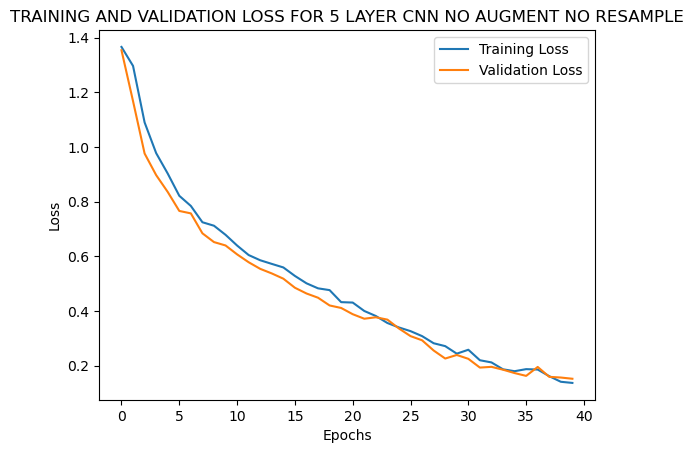

In [38]:
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('TRAINING AND VALIDATION LOSS FOR 5 LAYER CNN NO AUGMENT NO RESAMPLE')
plt.show()

### 5 LAYER CNN WITH AUGMENT WITH RESAMPLE

In [37]:
model = CustomCNN5()
print(model)
print(f"Number of trainable parameters: {count_parameters(model):,}")

CustomCNN5(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act): ReLU()
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=25088, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=4, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)
Number of trainable parameters: 14,479,748


In [38]:
import torch.optim as optim
from tqdm import tqdm
from sklearn.model_selection import train_test_split

MODEL_PATH = 'RESULTS/CUSTOM_5_LAYER_CNN_WITH_RESAMPLE_WITH_AUGMENT.pth'
OPTIMIZER_PATH = 'RESULTS/CUSTOM_5_LAYER_CNN_WITH_RESAMPLE_WITH_AUGMENT_OPTIMIZER.pth'

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
train_losses = []
val_losses = []
no_improve_epochs = 0
min_val_loss = float('inf')

num_epochs = 40
early_stopping_criteria = 3

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(train_dataloader_grayscale_with_aug, desc=f"Epoch {epoch+1}/{num_epochs}", unit='batch'):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels.long())
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(train_dataloader_grayscale_with_aug.dataset)
    train_losses.append(epoch_loss)
    print(f"Training Loss: {epoch_loss:.4f}")

    model.eval()
    with torch.no_grad():
        val_running_loss = 0.0
        for images, labels in tqdm(val_dataloader_grayscale_with_aug):
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels.long())

            val_running_loss += loss.item() * images.size(0)

        val_epoch_loss = val_running_loss / len(val_dataloader_grayscale_with_aug.dataset)
        val_losses.append(val_epoch_loss)

        print(f"Validation Loss: {val_epoch_loss:.4f}")
        
        if val_epoch_loss < min_val_loss:
            min_val_loss = val_epoch_loss
            no_improve_epochs = 0
            torch.save(model.state_dict(), MODEL_PATH)
            torch.save(optimizer.state_dict(), OPTIMIZER_PATH)
            print('SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW')
                
        else:
            no_improve_epochs += 1
    
        if no_improve_epochs >= early_stopping_criteria:
            print(f"Stopping early at epoch {epoch+1} due to no improvement in validation loss.")
            break    


Epoch 1/40: 100%|██████████| 32/32 [00:13<00:00,  2.45batch/s]


Training Loss: 1.3384


100%|██████████| 9/9 [00:00<00:00, 10.54it/s]


Validation Loss: 1.3312
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 2/40: 100%|██████████| 32/32 [00:12<00:00,  2.52batch/s]


Training Loss: 1.1993


100%|██████████| 9/9 [00:00<00:00, 10.36it/s]


Validation Loss: 1.3202
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 3/40: 100%|██████████| 32/32 [00:12<00:00,  2.55batch/s]


Training Loss: 1.1057


100%|██████████| 9/9 [00:00<00:00, 10.67it/s]


Validation Loss: 1.0457
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 4/40: 100%|██████████| 32/32 [00:12<00:00,  2.57batch/s]


Training Loss: 0.9320


100%|██████████| 9/9 [00:00<00:00, 10.47it/s]


Validation Loss: 0.7916
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 5/40: 100%|██████████| 32/32 [00:12<00:00,  2.53batch/s]


Training Loss: 0.8528


100%|██████████| 9/9 [00:00<00:00, 10.55it/s]


Validation Loss: 0.7483
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 6/40: 100%|██████████| 32/32 [00:12<00:00,  2.54batch/s]


Training Loss: 0.7859


100%|██████████| 9/9 [00:00<00:00, 10.87it/s]


Validation Loss: 0.7145
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 7/40: 100%|██████████| 32/32 [00:12<00:00,  2.56batch/s]


Training Loss: 0.7403


100%|██████████| 9/9 [00:00<00:00, 10.36it/s]


Validation Loss: 0.6333
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 8/40: 100%|██████████| 32/32 [00:12<00:00,  2.57batch/s]


Training Loss: 0.6587


100%|██████████| 9/9 [00:00<00:00, 10.25it/s]


Validation Loss: 0.5687
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 9/40: 100%|██████████| 32/32 [00:12<00:00,  2.55batch/s]


Training Loss: 0.6412


100%|██████████| 9/9 [00:00<00:00, 10.60it/s]


Validation Loss: 0.4950
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 10/40: 100%|██████████| 32/32 [00:12<00:00,  2.56batch/s]


Training Loss: 0.5681


100%|██████████| 9/9 [00:00<00:00, 10.52it/s]


Validation Loss: 0.4628
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 11/40: 100%|██████████| 32/32 [00:12<00:00,  2.50batch/s]


Training Loss: 0.5392


100%|██████████| 9/9 [00:00<00:00, 10.37it/s]


Validation Loss: 0.4563
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 12/40: 100%|██████████| 32/32 [00:12<00:00,  2.47batch/s]


Training Loss: 0.5024


100%|██████████| 9/9 [00:00<00:00, 10.46it/s]


Validation Loss: 0.4025
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 13/40: 100%|██████████| 32/32 [00:12<00:00,  2.53batch/s]


Training Loss: 0.4565


100%|██████████| 9/9 [00:00<00:00, 10.71it/s]


Validation Loss: 0.3711
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 14/40: 100%|██████████| 32/32 [00:12<00:00,  2.53batch/s]


Training Loss: 0.4213


100%|██████████| 9/9 [00:00<00:00, 10.51it/s]


Validation Loss: 0.3170
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 15/40: 100%|██████████| 32/32 [00:13<00:00,  2.44batch/s]


Training Loss: 0.4122


100%|██████████| 9/9 [00:00<00:00, 10.72it/s]


Validation Loss: 0.2954
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 16/40: 100%|██████████| 32/32 [00:12<00:00,  2.53batch/s]


Training Loss: 0.3858


100%|██████████| 9/9 [00:00<00:00, 10.69it/s]


Validation Loss: 0.2777
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 17/40: 100%|██████████| 32/32 [00:12<00:00,  2.52batch/s]


Training Loss: 0.3542


100%|██████████| 9/9 [00:00<00:00, 10.44it/s]


Validation Loss: 0.2500
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 18/40: 100%|██████████| 32/32 [00:12<00:00,  2.53batch/s]


Training Loss: 0.3641


100%|██████████| 9/9 [00:00<00:00, 10.39it/s]


Validation Loss: 0.2428
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 19/40: 100%|██████████| 32/32 [00:12<00:00,  2.55batch/s]


Training Loss: 0.3083


100%|██████████| 9/9 [00:00<00:00, 10.56it/s]


Validation Loss: 0.2270
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 20/40: 100%|██████████| 32/32 [00:12<00:00,  2.55batch/s]


Training Loss: 0.3247


100%|██████████| 9/9 [00:00<00:00, 10.35it/s]


Validation Loss: 0.2466


Epoch 21/40: 100%|██████████| 32/32 [00:12<00:00,  2.52batch/s]


Training Loss: 0.2944


100%|██████████| 9/9 [00:00<00:00, 10.65it/s]


Validation Loss: 0.1984
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 22/40: 100%|██████████| 32/32 [00:12<00:00,  2.51batch/s]


Training Loss: 0.2638


100%|██████████| 9/9 [00:00<00:00, 10.51it/s]


Validation Loss: 0.2076


Epoch 23/40: 100%|██████████| 32/32 [00:12<00:00,  2.52batch/s]


Training Loss: 0.2729


100%|██████████| 9/9 [00:00<00:00, 10.40it/s]


Validation Loss: 0.1793
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 24/40: 100%|██████████| 32/32 [00:12<00:00,  2.53batch/s]


Training Loss: 0.2378


100%|██████████| 9/9 [00:00<00:00, 10.44it/s]


Validation Loss: 0.1762
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 25/40: 100%|██████████| 32/32 [00:12<00:00,  2.51batch/s]


Training Loss: 0.2484


100%|██████████| 9/9 [00:00<00:00, 10.60it/s]


Validation Loss: 0.1993


Epoch 26/40: 100%|██████████| 32/32 [00:12<00:00,  2.50batch/s]


Training Loss: 0.2101


100%|██████████| 9/9 [00:00<00:00, 10.41it/s]


Validation Loss: 0.1993


Epoch 27/40: 100%|██████████| 32/32 [00:12<00:00,  2.55batch/s]


Training Loss: 0.2245


100%|██████████| 9/9 [00:00<00:00, 10.66it/s]

Validation Loss: 0.1821
Stopping early at epoch 27 due to no improvement in validation loss.


In [39]:
### BECAUSE MODEL STOPPED EARLY WE LOAD IT FROM THE BEST EPOCH
model.load_state_dict(torch.load(MODEL_PATH))

<All keys matched successfully>

In [40]:
from sklearn.metrics import classification_report

true_labels = []
pred_labels = []
labels_list = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']### ORIGINAL LABELS FROM DATASET

model.eval()
with torch.no_grad():
    for images, labels in tqdm(test_dataloader_grayscale_with_aug):
        images, labels = images.to(device), labels.to(device)

        outputs = model(images)
        
        _, predicted = torch.max(outputs.data, 1)

        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(predicted.cpu().numpy())


100%|██████████| 9/9 [00:01<00:00,  6.84it/s]


In [41]:
report = classification_report(true_labels, pred_labels, target_names=labels_list)

print(report)

                  precision    recall  f1-score   support

    glioma_tumor       0.95      0.95      0.95       338
meningioma_tumor       0.93      0.88      0.90       340
        no_tumor       0.87      0.97      0.92       152
 pituitary_tumor       0.97      0.98      0.97       318

        accuracy                           0.94      1148
       macro avg       0.93      0.94      0.94      1148
    weighted avg       0.94      0.94      0.94      1148



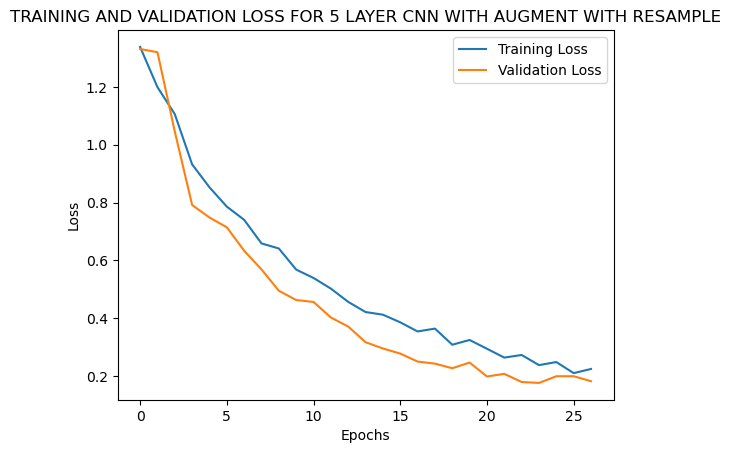

In [42]:
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('TRAINING AND VALIDATION LOSS FOR 5 LAYER CNN WITH AUGMENT WITH RESAMPLE')
plt.show()

### VIT WITH RESAMPLE WITH AUGMENT

In [31]:
from transformers import ViTForImageClassification

num_classes = 4 

model = ViTForImageClassification.from_pretrained(
    'google/vit-base-patch16-224',
    num_labels=num_classes,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
    output_attentions=True)

print(model)
print(f"Number of trainable parameters: {count_parameters(model):,}")
### DONT WORRY ABOUT WARNING MESSASES BELOW, THEY ARE NORMAL BECAUSE WE ARE CHANGING THE DEFAULT NUMBER OF OUTPUT CLASSES FOR VIT

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([4]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([4, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=7

In [32]:
import torch.optim as optim
from tqdm import tqdm
from sklearn.model_selection import train_test_split

MODEL_PATH = 'RESULTS/VIT_WITH_RESAMPLE_WITH_AUGMENT.pth'
OPTIMIZER_PATH = 'RESULTS/VIT_WITH_RESAMPLE_WITH_AUGMENT_OPTIMIZER.pth'

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.0001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
train_losses = []
val_losses = []
no_improve_epochs = 0
min_val_loss = float('inf')

num_epochs = 20
early_stopping_criteria = 3

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(train_dataloader_rgb_with_aug, desc=f"Epoch {epoch+1}/{num_epochs}", unit='batch'):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = model(images).logits
        loss = criterion(outputs, labels.long())
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(train_dataloader_rgb_with_aug.dataset)
    train_losses.append(epoch_loss)
    print(f"Training Loss: {epoch_loss:.4f}")

    model.eval()
    with torch.no_grad():
        val_running_loss = 0.0
        for images, labels in tqdm(val_dataloader_rgb_with_aug):
            images, labels = images.to(device), labels.to(device)

            outputs = model(images).logits
            loss = criterion(outputs, labels.long())

            val_running_loss += loss.item() * images.size(0)

        val_epoch_loss = val_running_loss / len(val_dataloader_rgb_with_aug.dataset)
        val_losses.append(val_epoch_loss)

        print(f"Validation Loss: {val_epoch_loss:.4f}")
        
        if val_epoch_loss < min_val_loss:
            min_val_loss = val_epoch_loss
            no_improve_epochs = 0
            torch.save(model.state_dict(), MODEL_PATH)
            torch.save(optimizer.state_dict(), OPTIMIZER_PATH)
            print('SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW')
                
        else:
            no_improve_epochs += 1
    
        if no_improve_epochs >= early_stopping_criteria:
            print(f"Stopping early at epoch {epoch+1} due to no improvement in validation loss.")
            break    


Epoch 1/20: 100%|██████████| 126/126 [01:25<00:00,  1.47batch/s]


Training Loss: 0.3775


100%|██████████| 36/36 [00:07<00:00,  4.91it/s]


Validation Loss: 0.2605
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 2/20: 100%|██████████| 126/126 [01:25<00:00,  1.48batch/s]


Training Loss: 0.1186


100%|██████████| 36/36 [00:07<00:00,  4.89it/s]


Validation Loss: 0.0833
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 3/20: 100%|██████████| 126/126 [01:25<00:00,  1.47batch/s]


Training Loss: 0.1006


100%|██████████| 36/36 [00:07<00:00,  4.93it/s]


Validation Loss: 0.1115


Epoch 4/20: 100%|██████████| 126/126 [01:25<00:00,  1.48batch/s]


Training Loss: 0.0554


100%|██████████| 36/36 [00:07<00:00,  4.90it/s]


Validation Loss: 0.1069


Epoch 5/20: 100%|██████████| 126/126 [01:25<00:00,  1.48batch/s]


Training Loss: 0.0572


100%|██████████| 36/36 [00:07<00:00,  4.87it/s]


Validation Loss: 0.0479
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 6/20: 100%|██████████| 126/126 [01:25<00:00,  1.47batch/s]


Training Loss: 0.0403


100%|██████████| 36/36 [00:07<00:00,  4.90it/s]


Validation Loss: 0.0623


Epoch 7/20: 100%|██████████| 126/126 [01:25<00:00,  1.48batch/s]


Training Loss: 0.0394


100%|██████████| 36/36 [00:07<00:00,  4.93it/s]


Validation Loss: 0.0480


Epoch 8/20: 100%|██████████| 126/126 [01:26<00:00,  1.47batch/s]


Training Loss: 0.0382


100%|██████████| 36/36 [00:07<00:00,  4.89it/s]


Validation Loss: 0.0249
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 9/20: 100%|██████████| 126/126 [01:25<00:00,  1.47batch/s]


Training Loss: 0.0232


100%|██████████| 36/36 [00:07<00:00,  4.91it/s]


Validation Loss: 0.1028


Epoch 10/20:   3%|▎         | 4/126 [00:03<01:45,  1.16batch/s]


KeyboardInterrupt: 

In [33]:
### BECAUSE MODEL STOPPED EARLY WE LOAD IT FROM THE BEST EPOCH
model.load_state_dict(torch.load(MODEL_PATH))

<All keys matched successfully>

In [34]:
from sklearn.metrics import classification_report

true_labels = []
pred_labels = []
labels_list = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']### ORIGINAL LABELS FROM DATASET

model.eval()
with torch.no_grad():
    for images, labels in tqdm(test_dataloader_rgb_with_aug):
        images, labels = images.to(device), labels.to(device)

        outputs = model(images).logits
        
        _, predicted = torch.max(outputs.data, 1)

        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(predicted.cpu().numpy())


100%|██████████| 36/36 [00:07<00:00,  4.64it/s]


In [35]:
report = classification_report(true_labels, pred_labels, target_names=labels_list)

print(report)

                  precision    recall  f1-score   support

    glioma_tumor       0.99      0.99      0.99       338
meningioma_tumor       1.00      0.99      0.99       340
        no_tumor       1.00      0.99      0.99       152
 pituitary_tumor       0.98      1.00      0.99       318

        accuracy                           0.99      1148
       macro avg       0.99      0.99      0.99      1148
    weighted avg       0.99      0.99      0.99      1148



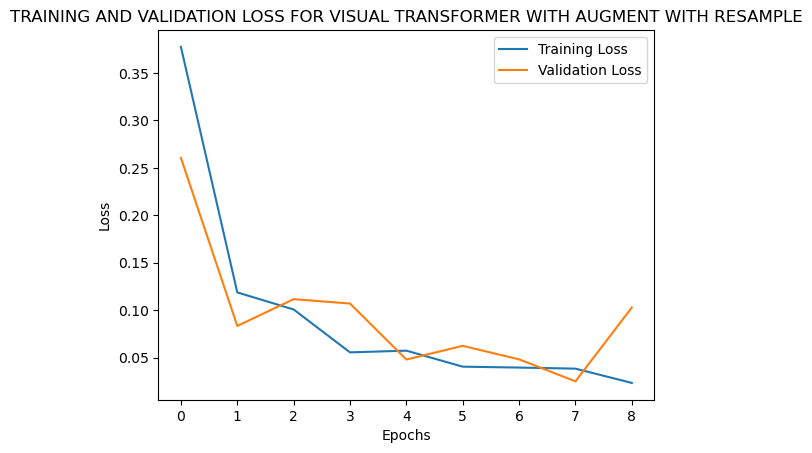

In [36]:
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('TRAINING AND VALIDATION LOSS FOR VISUAL TRANSFORMER WITH AUGMENT WITH RESAMPLE')
plt.show()

### RESNET WITH AUGMENT WITH RESAMPLE

In [32]:
from torchvision.models import resnet50
model = resnet50(pretrained=True)

C:\Users\N\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\N\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [33]:
model.fc = torch.nn.Linear(model.fc.in_features, 4) ### REPLACE LAST FULLY CONNECTED LAYER TO OUTPUT 4 CLASSES
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [34]:
import torch.optim as optim
from tqdm import tqdm
from sklearn.model_selection import train_test_split

MODEL_PATH = 'RESULTS/RESNET_WITH_RESAMPLE_WITH_AUGMENT.pth'
OPTIMIZER_PATH = 'RESULTS/RESNET_WITH_RESAMPLE_WITH_AUGMENT_OPTIMIZER.pth'

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.0001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
train_losses = []
val_losses = []
no_improve_epochs = 0
min_val_loss = float('inf')

num_epochs = 20
early_stopping_criteria = 3

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(train_dataloader_rgb_with_aug, desc=f"Epoch {epoch+1}/{num_epochs}", unit='batch'):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels.long())
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(train_dataloader_rgb_with_aug.dataset)
    train_losses.append(epoch_loss)
    print(f"Training Loss: {epoch_loss:.4f}")

    model.eval()
    with torch.no_grad():
        val_running_loss = 0.0
        for images, labels in tqdm(val_dataloader_rgb_with_aug):
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels.long())

            val_running_loss += loss.item() * images.size(0)

        val_epoch_loss = val_running_loss / len(val_dataloader_rgb_with_aug.dataset)
        val_losses.append(val_epoch_loss)

        print(f"Validation Loss: {val_epoch_loss:.4f}")
        
        if val_epoch_loss < min_val_loss:
            min_val_loss = val_epoch_loss
            no_improve_epochs = 0
            torch.save(model.state_dict(), MODEL_PATH)
            torch.save(optimizer.state_dict(), OPTIMIZER_PATH)
            print('SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW')
                
        else:
            no_improve_epochs += 1
    
        if no_improve_epochs >= early_stopping_criteria:
            print(f"Stopping early at epoch {epoch+1} due to no improvement in validation loss.")
            break    


Epoch 1/20: 100%|██████████| 63/63 [00:42<00:00,  1.50batch/s]


Training Loss: 0.5191


100%|██████████| 18/18 [00:02<00:00,  6.30it/s]


Validation Loss: 0.1848
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 2/20: 100%|██████████| 63/63 [00:40<00:00,  1.55batch/s]


Training Loss: 0.1812


100%|██████████| 18/18 [00:02<00:00,  6.44it/s]


Validation Loss: 0.1409
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 3/20: 100%|██████████| 63/63 [00:40<00:00,  1.55batch/s]


Training Loss: 0.1070


100%|██████████| 18/18 [00:02<00:00,  6.38it/s]


Validation Loss: 0.0928
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 4/20: 100%|██████████| 63/63 [00:40<00:00,  1.55batch/s]


Training Loss: 0.0820


100%|██████████| 18/18 [00:02<00:00,  6.39it/s]


Validation Loss: 0.0665
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 5/20: 100%|██████████| 63/63 [00:40<00:00,  1.55batch/s]


Training Loss: 0.0608


100%|██████████| 18/18 [00:02<00:00,  6.36it/s]


Validation Loss: 0.0670


Epoch 6/20: 100%|██████████| 63/63 [00:40<00:00,  1.55batch/s]


Training Loss: 0.0596


100%|██████████| 18/18 [00:02<00:00,  6.41it/s]


Validation Loss: 0.0650
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 7/20: 100%|██████████| 63/63 [00:40<00:00,  1.56batch/s]


Training Loss: 0.0518


100%|██████████| 18/18 [00:02<00:00,  6.43it/s]


Validation Loss: 0.0641
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 8/20: 100%|██████████| 63/63 [00:40<00:00,  1.55batch/s]


Training Loss: 0.0215


100%|██████████| 18/18 [00:02<00:00,  6.35it/s]


Validation Loss: 0.0505
SUCCESSFULLY SAVED BEST MODEL AND OPTIMIZER UNTIL NOW


Epoch 9/20: 100%|██████████| 63/63 [00:40<00:00,  1.56batch/s]


Training Loss: 0.0392


100%|██████████| 18/18 [00:02<00:00,  6.40it/s]


Validation Loss: 0.0570


Epoch 10/20: 100%|██████████| 63/63 [00:40<00:00,  1.55batch/s]


Training Loss: 0.0213


100%|██████████| 18/18 [00:02<00:00,  6.40it/s]


Validation Loss: 0.0545


Epoch 11/20: 100%|██████████| 63/63 [00:40<00:00,  1.56batch/s]


Training Loss: 0.0223


100%|██████████| 18/18 [00:02<00:00,  6.31it/s]

Validation Loss: 0.0562
Stopping early at epoch 11 due to no improvement in validation loss.


In [35]:
### BECAUSE MODEL STOPPED EARLY WE LOAD IT FROM THE BEST EPOCH
model.load_state_dict(torch.load(MODEL_PATH))

<All keys matched successfully>

In [36]:
from sklearn.metrics import classification_report

true_labels = []
pred_labels = []

labels_list = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor'] ### ORIGINAL LABELS FROM DATASET

model.eval()
with torch.no_grad():
    for images, labels in tqdm(test_dataloader_rgb_with_aug):
        images, labels = images.to(device), labels.to(device)

        outputs = model(images)
        
        _, predicted = torch.max(outputs.data, 1)

        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(predicted.cpu().numpy())

report = classification_report(true_labels, pred_labels, target_names=labels_list)

print(report)

100%|██████████| 18/18 [00:03<00:00,  5.65it/s]

                  precision    recall  f1-score   support

    glioma_tumor       0.99      1.00      0.99       338
meningioma_tumor       1.00      0.98      0.99       340
        no_tumor       0.99      1.00      1.00       152
 pituitary_tumor       0.99      1.00      1.00       318

        accuracy                           0.99      1148
       macro avg       0.99      0.99      0.99      1148
    weighted avg       0.99      0.99      0.99      1148



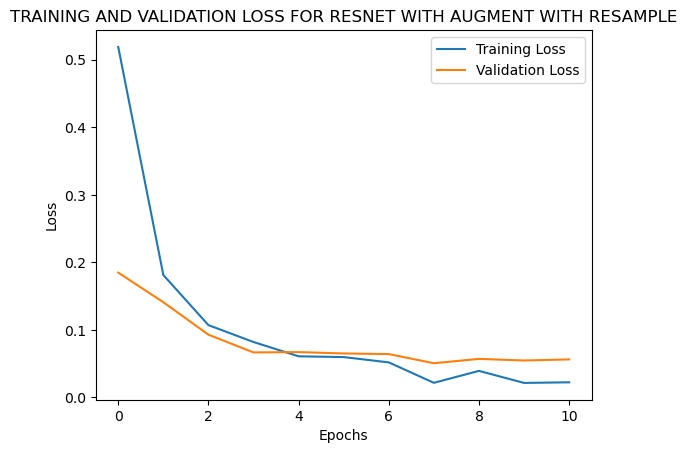

In [37]:
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('TRAINING AND VALIDATION LOSS FOR RESNET WITH AUGMENT WITH RESAMPLE')
plt.show()

# Visualizing results on the same test set

In [47]:
def visualize_heatmap_vit(model, test_index, plot_flag):
    test_image = test_dataset_rgb_with_aug[test_index][0].unsqueeze(0) ### GET TEST IMAGE FROM TEST DATASET
    logits, att_mat = model(test_image).logits, model(test_image).attentions ### GET ATTENTIONS FOR GIVEN IMAGE AFTER FORWARD PASS
    att_mat = torch.stack(att_mat).squeeze(1) ### STACK ALL THOSE ATTENTION MAPS
    att_mat = torch.mean(att_mat, dim=1) ### MEAN


    residual_att = torch.eye(att_mat.size(1)) 
    aug_att_mat = att_mat + residual_att ### NECESSARY STEP TO ACCOUNT FOR NO CONNECTIONS
    aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

    ### RECURSIVE CALCULATION OF ATTENTION
    joint_attentions = torch.zeros(aug_att_mat.size())
    joint_attentions[0] = aug_att_mat[0]

    for n in range(1, aug_att_mat.size(0)):
        joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n-1]) ### MATRIX MULTIPLICATION

    v = joint_attentions[-1]
    grid_size = int(np.sqrt(aug_att_mat.size(-1)))
    mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
    mask = cv2.resize(mask / mask.max(), (224,224))[..., np.newaxis]
    result = (mask * X_test_rgb[test_index]/255) ### MASK IS OVERLAYED ON IMAGE
    
    heatmap = plt.cm.jet(mask.squeeze())[:, :, :3] 
    heatmap = cv2.cvtColor((heatmap * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    #gray_image = cv2.cvtColor(X_test[0], cv2.COLOR_RGB2GRAY)
    overlayed_image = cv2.addWeighted(heatmap, 0.4, X_test_rgb[test_index], 0.6, 0)
    
    true = id2label[y_test_rgb[test_index]]
    pred = id2label[logits.argmax().detach().numpy().tolist()]
                    
    is_same = (true==pred)
    #plt.title(f"VIT TRUE:{id2label[y_test_rgb[test_index]]}, PRED:{id2label[logits.argmax().detach().numpy().tolist()]}")
    
    if plot_flag == True: ### ONLY PLOT RESULTING IMAGE IF PLOT FLAG == TRUE
    
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))

        axs[0].imshow(X_test_rgb[test_index], cmap='gray')
        axs[0].axis('off')  
        axs[0].set_title(f"LABEL: {true}, PREDICTION: {pred}")

        axs[1].imshow(overlayed_image)
        axs[1].axis('off')  
        axs[1].set_title('ATTENTION HEATMAP VIT')

        plt.show()
        
    return overlayed_image, pred    
    
    #return(plt.imshow(overlayed_image))

In [48]:
### CHECK PREDICTION AGAINST TRUE LABEL FUNCTION
def check_prediction(model, test_index):
    test_image = test_dataset[test_index][0].unsqueeze(0)
    logits, att_mat = model(test_image).logits, model(test_image).attentions  
    true = id2label[y_test[test_index]]
    pred = id2label[logits.argmax().detach().numpy().tolist()]
                    
    is_same = (true==pred)
    #plt.title(f"TRUE LABEL:{id2label[y_test[test_index]]}, PREDICTION:{id2label[logits.argmax().detach().numpy().tolist()]}")
    return(is_same)

In [49]:
from transformers import ViTForImageClassification

num_classes = 4 
model_vit = ViTForImageClassification.from_pretrained(
    'google/vit-base-patch16-224',
    num_labels=num_classes,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
    output_attentions=True)

MODEL_PATH_VIT = 'RESULTS/VIT_WITH_RESAMPLE_WITH_AUGMENT.pth'
model_vit.load_state_dict(torch.load(MODEL_PATH_VIT)) ### LOAD BEST VIT UNTIL NOW
### IF OUTPUT CELL DOES NOT OUTPUT "<All keys matched successfully>, THEN MODEL WAS NOT LOADER PROPERLY"

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([4]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([4, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


<All keys matched successfully>

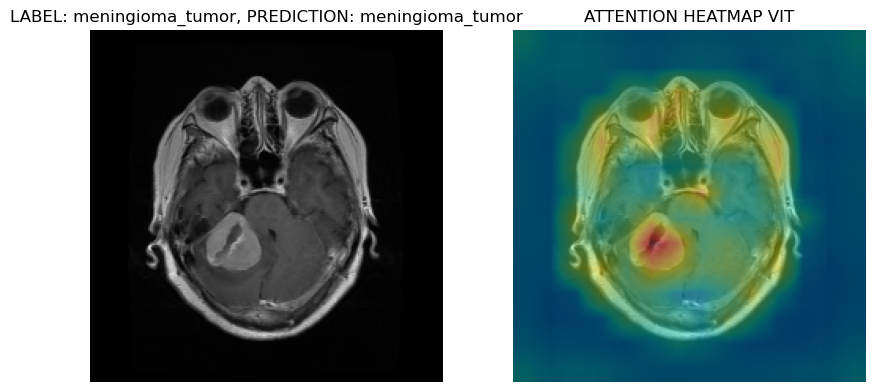

(array([[[  8, 102,  90],
         [  8, 102,  90],
         [  8, 102,  90],
         ...,
         [  3,  96,  95],
         [  3,  96,  95],
         [  3,  96,  95]],
 
        [[  8, 102,  90],
         [  8, 102,  90],
         [  8, 102,  90],
         ...,
         [  3,  96,  95],
         [  3,  96,  95],
         [  3,  96,  95]],
 
        [[  8, 102,  90],
         [  8, 102,  90],
         [  8, 102,  90],
         ...,
         [  3,  96,  95],
         [  3,  96,  95],
         [  3,  96,  95]],
 
        ...,
 
        [[  3,  96,  95],
         [  3,  96,  95],
         [  3,  96,  95],
         ...,
         [  0,  90, 100],
         [  0,  90, 100],
         [  0,  90, 100]],
 
        [[  3,  96,  95],
         [  3,  96,  95],
         [  3,  96,  95],
         ...,
         [  0,  90, 100],
         [  0,  90, 100],
         [  0,  90, 100]],
 
        [[  3,  96,  95],
         [  3,  96,  95],
         [  3,  96,  95],
         ...,
         [  0,  90, 100],
  

In [50]:
visualize_heatmap_vit(model_vit, 100, True) ### EXAMPLE VISUALIZATION OF ATTENTION MAP FOR VIT (THE MEAN ATTENTION HEATMAP)

### Functions for CNNs

In [51]:
### FIRST LOAD ALL THE TRAINED MODELS

In [52]:
MODEL_PATH_SIMPLE_CNN_NO_AUG = 'RESULTS/SIMPLE_CNN_NO_RESAMPLE_NO_AUGMENT.pth'
model_simple_cnn_no_aug = SimpleCNN()
model_simple_cnn_no_aug.load_state_dict(torch.load(MODEL_PATH_SIMPLE_CNN_NO_AUG))
device=torch.device('cuda')
model_simple_cnn_no_aug.to(device)

SimpleCNN(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=200704, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=4, bias=True)
)

In [53]:
MODEL_PATH_SIMPLE_CNN_WITH_AUG = 'RESULTS/SIMPLE_CNN_WITH_RESAMPLE_WITH_AUGMENT.pth'
model_simple_cnn_with_aug = SimpleCNN()
model_simple_cnn_with_aug.load_state_dict(torch.load(MODEL_PATH_SIMPLE_CNN_WITH_AUG))
device=torch.device('cuda')
model_simple_cnn_with_aug.to(device)

SimpleCNN(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=200704, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=4, bias=True)
)

In [54]:
MODEL_PATH_CUSTOM_CNN_NO_AUG = 'RESULTS/CUSTOM_5_LAYER_CNN_NO_RESAMPLE_NO_AUGMENT.pth'
model_custom_cnn_no_aug = CustomCNN5()
model_custom_cnn_no_aug.load_state_dict(torch.load(MODEL_PATH_CUSTOM_CNN_NO_AUG))
device=torch.device('cuda')
model_custom_cnn_no_aug.to(device)

CustomCNN5(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act): ReLU()
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=25088, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=4, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [55]:
MODEL_PATH_CUSTOM_CNN_WITH_AUG = 'RESULTS/CUSTOM_5_LAYER_CNN_WITH_RESAMPLE_WITH_AUGMENT.pth'
model_custom_cnn_with_aug = CustomCNN5()
model_custom_cnn_with_aug.load_state_dict(torch.load(MODEL_PATH_CUSTOM_CNN_WITH_AUG))
device=torch.device('cuda')
model_custom_cnn_with_aug.to(device)

CustomCNN5(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act): ReLU()
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=25088, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=4, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [56]:
### FUNCTION TO GET THE SALIENCY MASK 
def get_saliency(model, dataset, test_index):
    
    image, lab = dataset[test_index] ### GET IMAGE FROM DATASET

    image = image.to(device) ### MOVE TO SAME DEVICE AS MODEL
    image.requires_grad_() ### SET THE IMAGE TO REQUIRE GRAD, BECAUSE WE NEED GRADIENTS FOR SALIENCY MAPS!
    output = model(image) ### FORWARD
    output_idx = output.argmax() ### GET PREDICTION
    model.zero_grad()
    output[0, output_idx].backward() ### BACKWARD PASS TO GET SALIENCY
    saliency = image.grad.data
    saliency = saliency.abs() ### ABSOLUTE VALUES, NO NEGATIVES
    saliency = saliency.squeeze(0)
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min()) ### NORMALIZE MASK
    
    pred = id2label[output_idx.cpu().detach().item()]
        
    return saliency.cpu().detach().numpy(), pred    

In [57]:
### FUNCTION TO GET THE GRAD-CAM FROM A TRAINED CNN
### WE CAN CHANGE THE LAST_CONV_LAYER TO GET GRAD-CAMS FOR DIFFERENT LAYERS !!!
def get_custom_gradcam(model, dataset, test_index, last_conv_layer):
    
    activations = []
    gradients = []
    
    ### GRAD-CAM REQUIRES BOTH FORWARD AND BACKWARD HOOKS TO GET GRADIENTS 
    def forward_hook(module, input, output):
        activations.append(output)

    def backward_hook(module, grad_in, grad_out):
        gradients.append(grad_out[0])

    def generate_gradcam(activations, gradients):
        gradient = gradients[-1]  
        activation = activations[-1] 
        b, k, u, v = gradient.size()

        alpha = gradient.view(b, k, -1).mean(2)
        weights = alpha.view(b, k, 1, 1)

        gradcam = F.relu((weights * activation).sum(1, keepdim=True))
        return gradcam[0]  
    
    #activations = []
    #gradients = []
    
    #last_conv_layer = model.conv5
    last_conv_layer.register_forward_hook(forward_hook)
    last_conv_layer.register_backward_hook(backward_hook)
    
    
    
    input_img = dataset[test_index][0].unsqueeze(0).to(device)

    
    output = model(input_img) ### FORWARD
    output = F.softmax(output, dim=1)

    
    target_class = output.argmax().item()
    model.zero_grad()
    output[0, target_class].backward() ### BACKWARD

    
    gradcam = generate_gradcam(activations, gradients)

    
    gradcam = gradcam.squeeze().cpu().detach().numpy()
    gradcam = gradcam - np.min(gradcam)
    gradcam = gradcam / np.max(gradcam)
    gradcam = cv2.resize(gradcam, (224, 224)) ### RESIZING GRAD-CAM TO GET OVERLAY ON ORIGINAL IMAGE

    
    original_img = input_img.squeeze(0).movedim(0,-1).cpu().numpy()
    original_img = np.repeat(original_img, 3, axis=2)

    gradcam_rev = 1 - gradcam ### GET NEGATIVE COLORS BECAUSE LINE BELOW USES JET COLORMAP

    
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam_rev), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255  ### FLOAT
    #superimposed_img = heatmap * 0.2 + original_img.movedim(0,-1).cpu().numpy()
    superimposed_img = cv2.addWeighted(heatmap, 0.4, original_img, 0.6, 0)
    
    #last_conv_layer.remove()
    #last_conv_layer.remove()
        
    return superimposed_img,  id2label[target_class]  

### Functions for Resnet Gradcam

In [58]:
### CUSTOM GRAD-CAM MODULE FOR RESNET
### USED TO SEE IF THERE ARE DIFFERENCES BETWEEN GARD-CAM MODULE AND MY CUSTOM GRAD-CAM FUNCTIONS
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet50

In [59]:
from torchvision.models import resnet50
model_resnet_with_aug = resnet50(pretrained=True)

C:\Users\N\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\N\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [60]:
### FIRST CHANGE THE FULLY CONNECTED LAYER, AND THEN LOAD THE BEST MODEL !
model_resnet_with_aug.fc = torch.nn.Linear(model_resnet_with_aug.fc.in_features, 4)
model_resnet_with_aug

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [61]:
MODEL_PATH_RESNET_WITH_AUG = 'RESULTS/RESNET_WITH_RESAMPLE_WITH_AUGMENT.pth'
model_resnet_with_aug.load_state_dict(torch.load(MODEL_PATH_RESNET_WITH_AUG))
device=torch.device('cuda')
model_resnet_with_aug.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [62]:
def get_resnet_gradcam(model, dataset, test_index):
    target_layers = [model.layer4[-1]]
    input_tensor = dataset[test_index][0].unsqueeze(0).to(device)
    cam = GradCAM(model=model, target_layers=target_layers) ### GRAD-CAM MODULE
    logs = model(input_tensor)
    pred_label = id2label[logs.argmax(dim=1).cpu().detach().numpy().tolist()[0]]

    grayscale_cam = cam(input_tensor=input_tensor, targets=None, aug_smooth=True, eigen_smooth=True)
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(X_test_rgb[test_index]/255, grayscale_cam, use_rgb=True)

       
    return visualization, pred_label  

### Function to visualize everything together

In [63]:
### VISUALIZE EVERYTHING TOGETHER, USING PREVIOUS FUNCTIONS
def visualize_all_methods(test_index):
    
    simple_cnn_saliency_no_aug, simple_cnn_pred_no_aug = get_saliency(model_simple_cnn_no_aug, test_dataset_grayscale_no_aug, test_index)
    simple_cnn_gradcam_no_aug, simple_cnn_pred_gradcam_no_aug = get_custom_gradcam(model_simple_cnn_no_aug, test_dataset_grayscale_no_aug, test_index, model_simple_cnn_no_aug.conv2)
    
    simple_cnn_saliency_with_aug, simple_cnn_pred_with_aug = get_saliency(model_simple_cnn_with_aug, test_dataset_grayscale_with_aug, test_index)
    simple_cnn_gradcam_with_aug, simple_cnn_pred_gradcam_with_aug = get_custom_gradcam(model_simple_cnn_with_aug, test_dataset_grayscale_no_aug, test_index, model_simple_cnn_with_aug.conv2)

    custom_cnn_saliency_no_aug, custom_cnn_pred_no_aug = get_saliency(model_custom_cnn_no_aug, test_dataset_grayscale_no_aug, test_index)
    custom_cnn_gradcam_no_aug, custom_cnn_pred_gradcam_no_aug = get_custom_gradcam(model_custom_cnn_no_aug, test_dataset_grayscale_no_aug, test_index, model_custom_cnn_no_aug.conv5)
    
    custom_cnn_saliency_with_aug, custom_cnn_pred_with_aug = get_saliency(model_custom_cnn_with_aug, test_dataset_grayscale_with_aug, test_index)
    custom_cnn_gradcam_with_aug, custom_cnn_pred_gradcam_with_aug = get_custom_gradcam(model_custom_cnn_with_aug, test_dataset_grayscale_with_aug, test_index, model_custom_cnn_with_aug.conv5) 
    
    
    vit_attention_heatmap_with_aug, vit_pred_with_aug = visualize_heatmap_vit(model_vit, test_index, False)
    
    resnet_gradcam_with_aug, resnet_pred_with_aug = get_resnet_gradcam(model_resnet_with_aug, test_dataset_rgb_with_aug, test_index)

    original_image = test_dataset_grayscale_no_aug[test_index][0].squeeze(0)
    original_label = id2label[y_test_grayscale[test_index]].split("_")[0]
    
    
    fig, axs = plt.subplots(5, 3, figsize=(14, 18))
    
    #####################################################################################################
    
    ### SIMPLE CNN NO AUG SALIENCY
    axs[0, 0].imshow(simple_cnn_saliency_no_aug, cmap='hot', aspect='auto')
    axs[0, 0].axis('off')  
    axs[0, 0].set_title(f"PRED SIMPLE CNN NO AUG: {simple_cnn_pred_no_aug.split('_')[0]}")

    ### SIMPLE CNN NO AUG GRADCAM
    axs[0, 1].imshow(simple_cnn_gradcam_no_aug, aspect='auto')
    axs[0, 1].axis('off')  
    axs[0, 1].set_title(f"SIMPLE CNN NO AUG GRADCAM: {simple_cnn_pred_gradcam_no_aug.split('_')[0]}")
    
    ### ORIGINAL PHOTO 
    axs[0, 2].imshow(original_image, cmap='gray', aspect='auto')
    axs[0, 2].axis('off')  
    axs[0, 2].set_title(f"ORIGINAL IMAGE: {original_label}")
    
    
    ### SIMPLE CNN WITH AUG SALIENCY
    axs[1, 0].imshow(simple_cnn_saliency_with_aug, cmap='hot', aspect='auto')
    axs[1, 0].axis('off')  
    axs[1, 0].set_title(f"PRED SIMPLE CNN WITH AUG: {simple_cnn_pred_with_aug.split('_')[0]}")
    
    ### SIMPLE CNN WITH AUG GRADCAM
    axs[1, 1].imshow(simple_cnn_gradcam_with_aug, aspect='auto')
    axs[1, 1].axis('off')  
    axs[1, 1].set_title(f"SIMPLE CNN WITH AUG GRADCAM: {simple_cnn_pred_gradcam_with_aug.split('_')[0]}")
    
     ### ORIGINAL PHOTO 
    axs[1, 2].imshow(original_image, cmap='gray', aspect='auto')
    axs[1, 2].axis('off')  
    axs[1, 2].set_title(f"ORIGINAL IMAGE: {original_label}")
    
    ###################################################################################################
    
    ### CUSTOM CNN NO AUG SALIENCY
    axs[2, 0].imshow(custom_cnn_saliency_no_aug, cmap='hot', aspect='auto')
    axs[2, 0].axis('off')  
    axs[2, 0].set_title(f"PRED CUSTOM CNN NO AUG: {custom_cnn_pred_no_aug.split('_')[0]}")
    
    ### CUSTOM CNN NO AUG GRADCAM
    axs[2, 1].imshow(custom_cnn_gradcam_no_aug, aspect='auto')
    axs[2, 1].axis('off')  
    axs[2, 1].set_title(f"CUSTOM CNN NO AUG GRADCAM: {custom_cnn_pred_gradcam_no_aug.split('_')[0]}")
    
    ### ORIGINAL PHOTO 
    axs[2, 2].imshow(original_image, cmap='gray', aspect='auto')
    axs[2, 2].axis('off')  
    axs[2, 2].set_title(f"ORIGINAL IMAGE: {original_label}")
    
    
    ### CUSTOM CNN WITH AUG SALIENCY
    axs[3, 0].imshow(custom_cnn_saliency_with_aug, cmap='hot', aspect='auto')
    axs[3, 0].axis('off')  
    axs[3, 0].set_title(f"PRED CUSTOM CNN WITH AUG: {custom_cnn_pred_with_aug.split('_')[0]}")
    
    ### CUSTOM CNN WITH AUG GRADCAM
    axs[3, 1].imshow(custom_cnn_gradcam_with_aug, aspect='auto')
    axs[3, 1].axis('off')  
    axs[3, 1].set_title(f"CUSTOM CNN WITH AUG GRADCAM: {custom_cnn_pred_gradcam_with_aug.split('_')[0]}")
    
    ### ORIGINAL PHOTO
    axs[3, 2].imshow(original_image, cmap='gray', aspect='auto')
    axs[3, 2].axis('off')  
    axs[3, 2].set_title(f"ORIGINAL IMAGE: {original_label}")
    
    #####################################################################################################
    
    ### VIT WITH AUG ATTENTION HEATMAP
    axs[4, 0].imshow(vit_attention_heatmap_with_aug, aspect='auto')
    axs[4, 0].axis('off')  
    axs[4, 0].set_title(f"PRED VIT WITH AUG: {vit_pred_with_aug.split('_')[0]}")
    
    ### RESNET WITH AUG GRADCAM
    axs[4, 1].imshow(resnet_gradcam_with_aug, aspect='auto')
    axs[4, 1].axis('off')  
    axs[4, 1].set_title(f"PRED RESNET WITH AUG: {resnet_pred_with_aug.split('_')[0]}") 
    
    ### ORIGINAL PHOTO
    axs[4, 2].imshow(original_image, cmap='gray', aspect='auto')
    axs[4, 2].axis('off')  
    axs[4, 2].set_title(f"ORIGINAL IMAGE: {original_label}")
    
    plt.show()

C:\Users\N\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1359: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


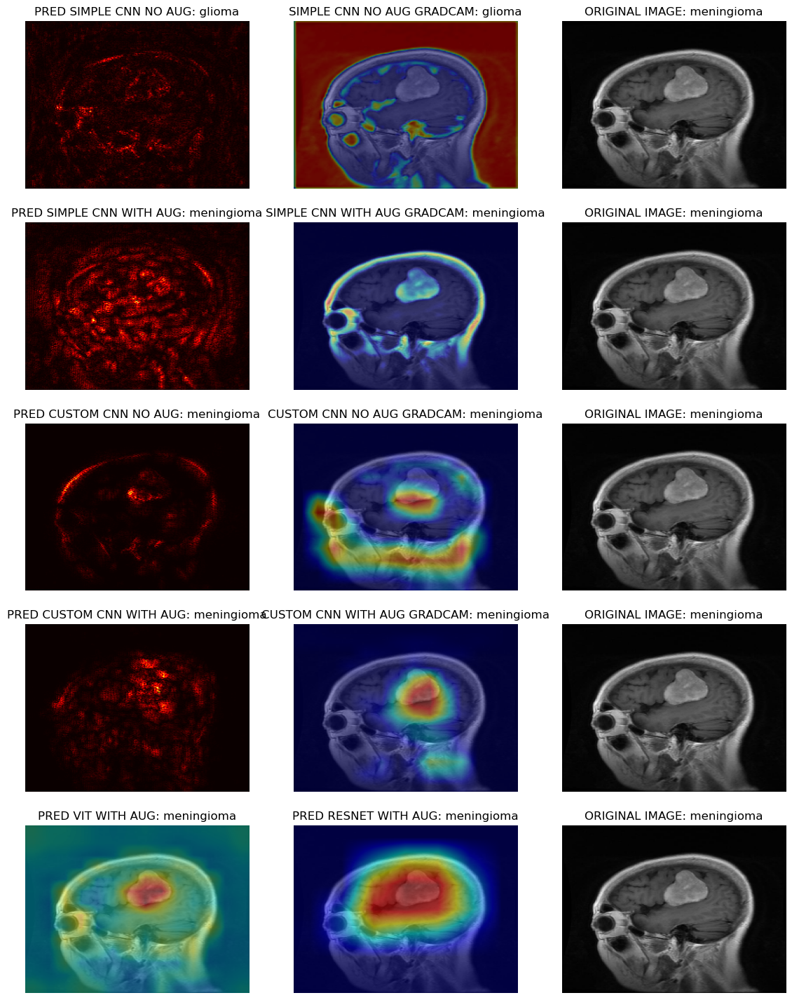

In [64]:
### CHANGE INDEX BELOW TO GET PREDICTIONS FOR DIFFERENT DATA IN THE TEST SET
visualize_all_methods(1120)

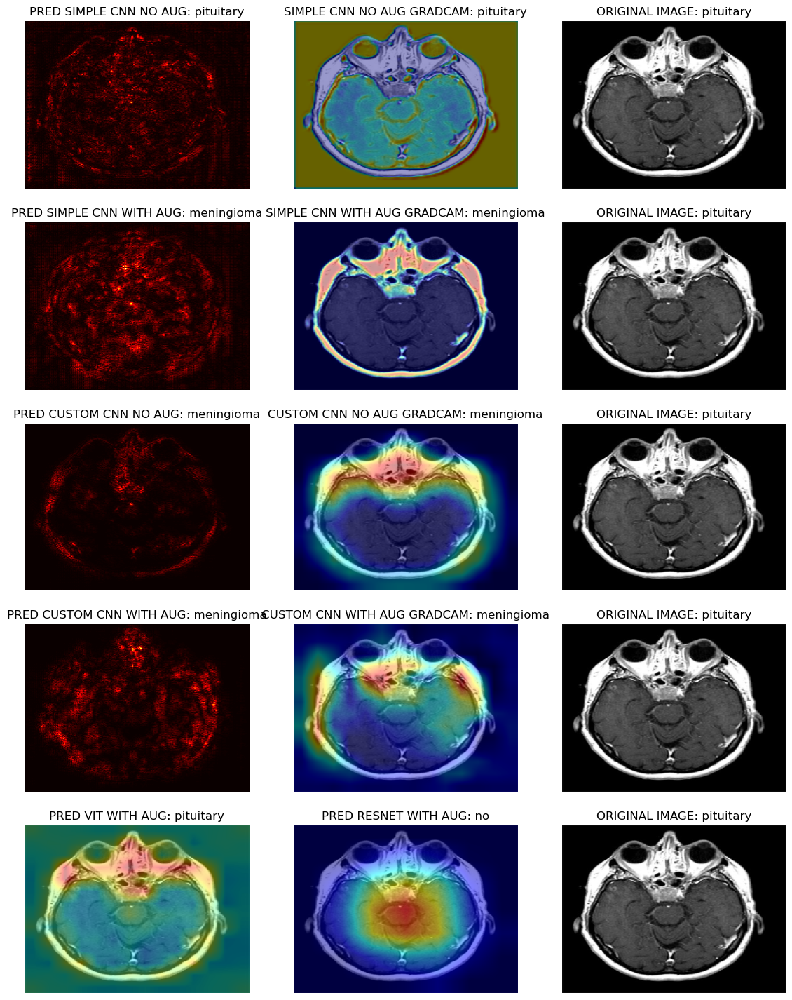

In [65]:
visualize_all_methods(1072)

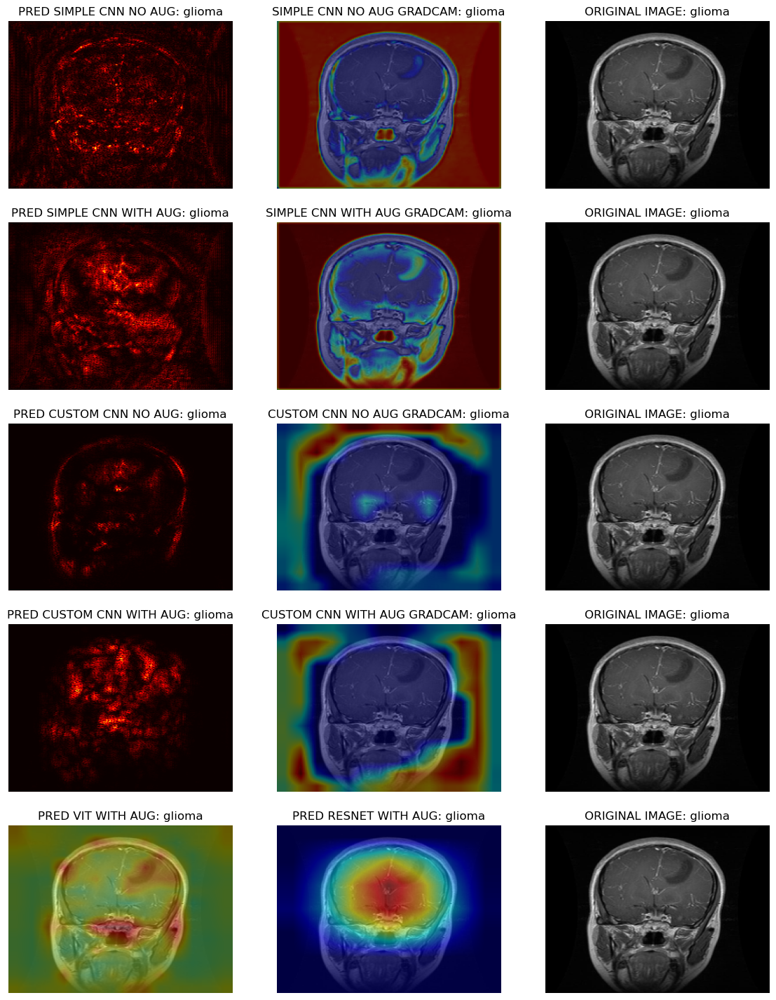

In [66]:
visualize_all_methods(20)

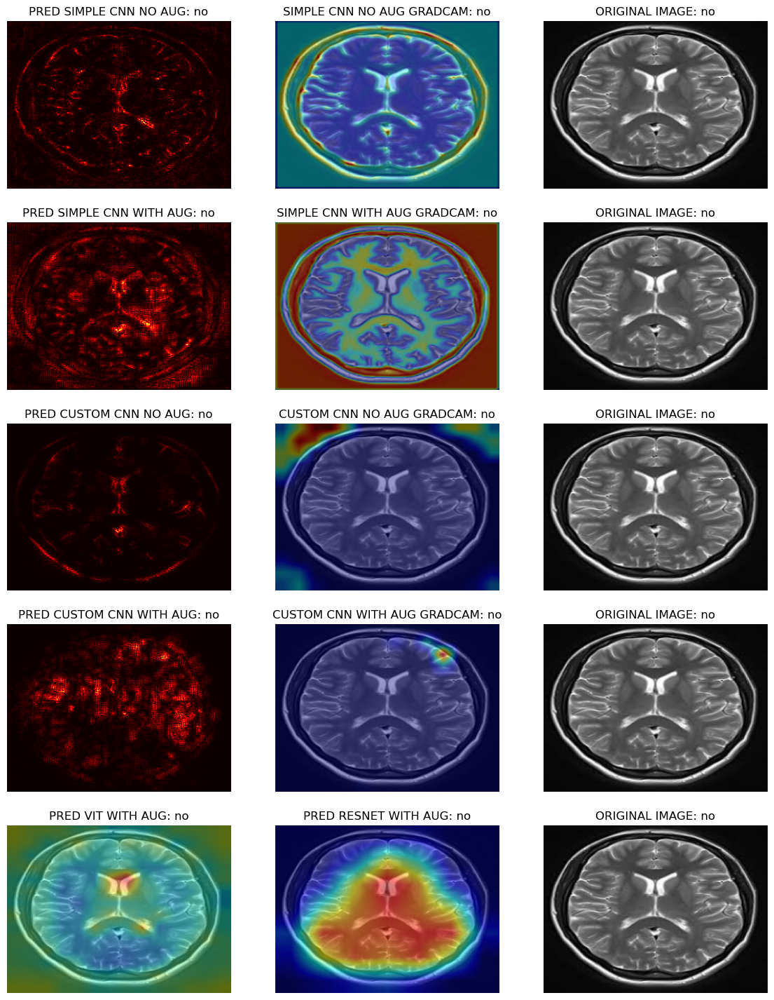

In [67]:
visualize_all_methods(245)

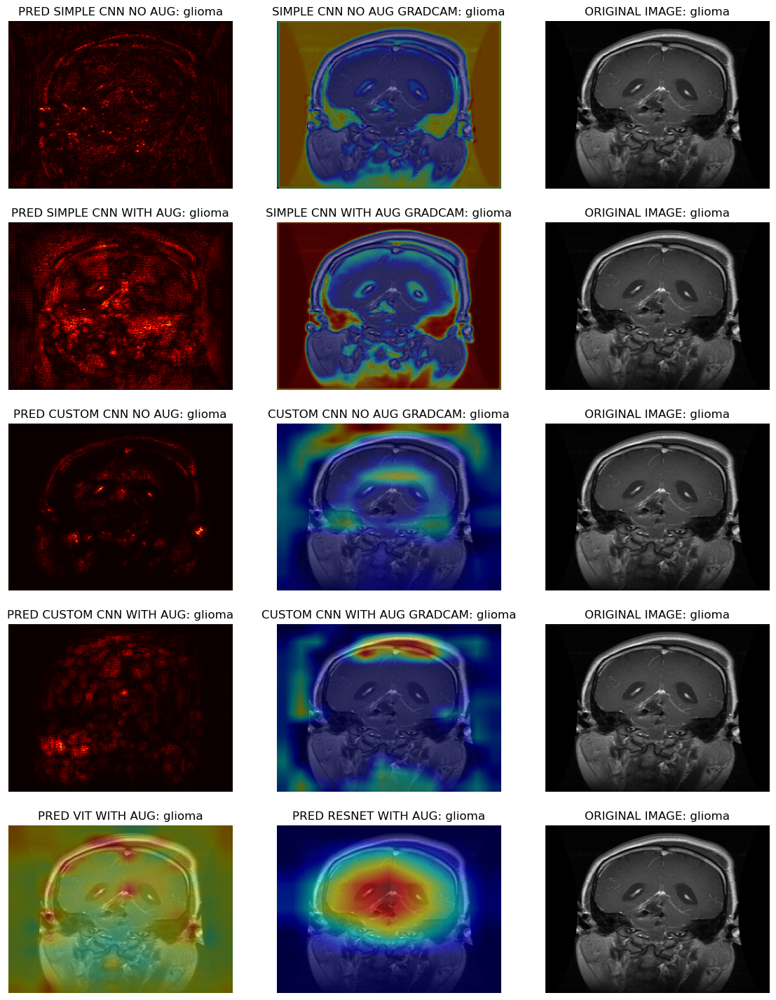

In [68]:
visualize_all_methods(580)

In [70]:
### FUNCTION TO TEST MODELS ON A GIVEN DATALOADER, TO GET CONFUSION MATRICES ETC
def test_model(model, dataloader):
    
    device = torch.device('cuda')
    model.to(device)
    model.eval()

    from sklearn.metrics import classification_report

    true_labels = []
    pred_labels = []
    logits = []

    labels_list = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor'] ### ORIGINAL LABELS FROM DATASET

    with torch.no_grad():
        for images, labels in tqdm(dataloader):
            images, labels = images.to(device), labels.to(device)

            outputs = model(images) 

            logits.extend(outputs.cpu().numpy())

            _, predicted = torch.max(outputs.data, 1)

            true_labels.extend(labels.cpu().numpy())
            pred_labels.extend(predicted.cpu().numpy())

    report = classification_report(true_labels, pred_labels, target_names=labels_list)

    print(report)
    
    return true_labels, pred_labels

In [45]:
### RUN CELL BELOW FOR DIFFERENT MODELS AND RESPECTIVE DATALOADERS TO GET PREDICTIONS FOR ALL MODELS

In [71]:
trues, labs = test_model(model_resnet_with_aug, test_dataloader_rgb_with_aug)

100%|██████████| 36/36 [00:03<00:00,  9.79it/s]

                  precision    recall  f1-score   support

    glioma_tumor       0.99      1.00      0.99       338
meningioma_tumor       1.00      0.98      0.99       340
        no_tumor       0.99      1.00      1.00       152
 pituitary_tumor       0.99      1.00      1.00       318

        accuracy                           0.99      1148
       macro avg       0.99      0.99      0.99      1148
    weighted avg       0.99      0.99      0.99      1148



In [72]:
from sklearn.metrics import confusion_matrix
labels_list = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor'] ### ORIGINAL LABELS FROM DATASET


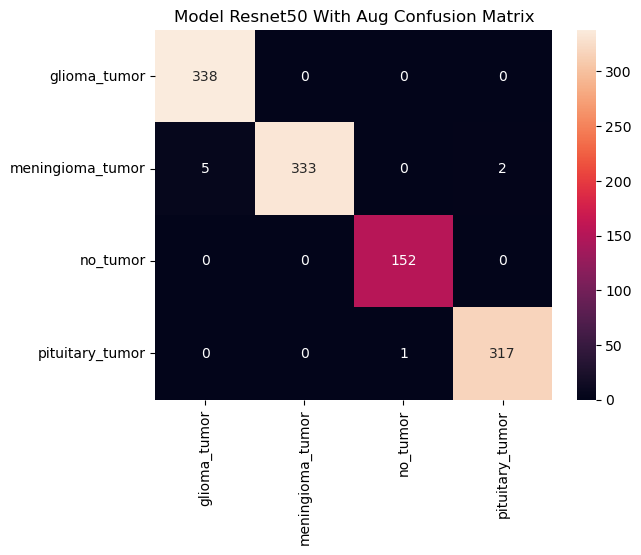

In [73]:
sns.heatmap(confusion_matrix(trues, labs), annot=True, fmt='d', xticklabels=labels_list, yticklabels=labels_list)
plt.title('Model Resnet50 With Aug Confusion Matrix')
plt.show()

In [65]:
### FIND FALSE NEGATIVES FOR A GIVEN MODEL
false_negatives = []
for index, i in enumerate(trues):
    if i != 2 and labs[index] == 2:
        print(index)
        false_negatives.append(index)

8
145
791


In [166]:
model_simple_cnn_no_aug.eval()

from sklearn.metrics import classification_report

true_labels = []
pred_labels = []
logits = []

labels_list = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor'] ### ORIGINAL LABELS FROM DATASET

with torch.no_grad():
    for images, labels in tqdm(test_dataloader_grayscale_no_aug):
        images, labels = images.to(device), labels.to(device)

        outputs = model_simple_cnn_no_aug(images) 
        
        logits.extend(outputs.cpu().numpy())
        
        _, predicted = torch.max(outputs.data, 1)

        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(predicted.cpu().numpy())

report = classification_report(true_labels, pred_labels, target_names=labels_list)

print(report)

100%|██████████| 9/9 [00:16<00:00,  1.79s/it]

                  precision    recall  f1-score   support

    glioma_tumor       0.94      0.91      0.93       338
meningioma_tumor       0.89      0.93      0.91       340
        no_tumor       0.95      0.93      0.94       152
 pituitary_tumor       1.00      0.99      1.00       318

        accuracy                           0.94      1148
       macro avg       0.95      0.94      0.94      1148
    weighted avg       0.94      0.94      0.94      1148



In [198]:
### FIND ALL WRONG PREDICTIONS FROM MODEL
np.where(np.array(true_labels) != np.array(pred_labels))

(array([   8,   10,   47,   65,   95,  104,  139,  145,  159,  186,  213,
         219,  220,  227,  229,  235,  242,  255,  275,  288,  361,  367,
         376,  404,  418,  425,  431,  438,  453,  486,  516,  533,  571,
         577,  635,  663,  670,  681,  703,  731,  735,  736,  745,  765,
         777,  791,  810,  817,  850,  865,  885,  900,  954,  988,  990,
         994, 1005, 1011, 1014, 1021, 1057, 1071, 1073, 1075, 1079, 1120],
       dtype=int64),)

### ROC CURVES

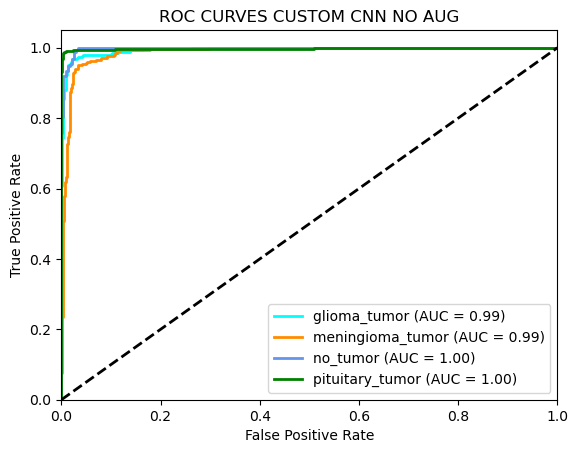

In [171]:
### ROC CURVES CALCULATION WITH SKLEARN
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

n_classes = 4

y_bin = label_binarize(true_labels, classes=range(n_classes)) ### BINARIZE FOR ONE VS REST

logits = np.array(logits)
y_score = np.exp(logits) / np.exp(logits).sum(axis=1, keepdims=True) ### SOFTMAX

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_score[:, i]) ### ROC CURVE FUNCTION FROM SKLEARN
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure()

colors = ['aqua', 'darkorange', 'cornflowerblue', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='{0} (AUC = {1:0.2f})'.format(labels_list[i], roc_auc[i]))  

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC CURVES CUSTOM CNN NO AUG')  
plt.legend(loc="best")
plt.show()

In [87]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
def get_roc_curves(model, dataloader, model_name):
    
    true_labels = []
    pred_labels = []
    logits = []

    labels_list = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']### ORIGINAL LABELS FROM DATASET

    with torch.no_grad():
        for images, labels in tqdm(dataloader):
            images, labels = images.to(device), labels.to(device)

            outputs = model(images) 

            logits.extend(outputs.cpu().numpy())

            _, predicted = torch.max(outputs.data, 1)

            true_labels.extend(labels.cpu().numpy())
            pred_labels.extend(predicted.cpu().numpy())
            
    n_classes = 4

    y_bin = label_binarize(true_labels, classes=range(n_classes))

    logits = np.array(logits)
    y_score = np.exp(logits) / np.exp(logits).sum(axis=1, keepdims=True)

    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure()

    colors = ['aqua', 'darkorange', 'cornflowerblue', 'green']
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label='{0} (AUC = {1:0.2f})'.format(labels_list[i], roc_auc[i]))  

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC CURVES FOR MODEL: {model_name}')  
    plt.legend(loc="best")
    plt.show()

100%|██████████| 36/36 [00:03<00:00, 10.91it/s]


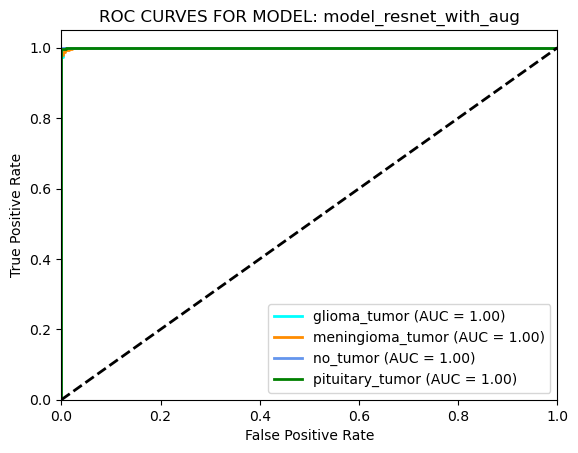

In [88]:
get_roc_curves(model_resnet_with_aug, test_dataloader_rgb_with_aug, 'model_resnet_with_aug')

### PRECISION-RECALL CURVES FROM SKLEARN

In [460]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.preprocessing import label_binarize

In [467]:
### PRECISION-RECALL CURVES FROM SKLEARN
def get_precision_recall_curves(model, dataloader, model_name):
    
    true_labels = []
    pred_labels = []
    logits = []

    labels_list = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor'] ### ORIGINAL LABELS FROM DATASET

    with torch.no_grad():
        for images, labels in tqdm(dataloader):
            images, labels = images.to(device), labels.to(device)

            outputs = model(images) 

            logits.extend(outputs.cpu().numpy())

            _, predicted = torch.max(outputs.data, 1)

            true_labels.extend(labels.cpu().numpy())
            pred_labels.extend(predicted.cpu().numpy())
            
    n_classes = 4

    y_bin = label_binarize(true_labels, classes=range(n_classes))

    logits = np.array(logits)
    y_score = np.exp(logits) / np.exp(logits).sum(axis=1, keepdims=True)

    precision = dict()
    recall = dict()
    average_precision = dict()

    for i in range(n_classes):
        precision[i], recall[i], _ = precision_recall_curve(y_bin[:, i], logits[:, i]) ### PRECISION RECALL FUNCTION FROM SKLEARN
        average_precision[i] = average_precision_score(y_bin[:, i], logits[:, i])

    plt.figure()

    colors = ['aqua', 'darkorange', 'cornflowerblue', 'green']
    for i, color in zip(range(n_classes), colors):
        plt.plot(precision[i], recall[i], color=color, lw=2,
                 label=f'{labels_list[i]} (AP = {average_precision[i]:0.2f})')  

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('RECALL')
    plt.ylabel('PRECISION')
    plt.title(f'PRECISION RECALL CURVE FOR MODEL: {model_name}')  
    plt.legend(loc="best")
    plt.show()

100%|██████████| 9/9 [00:01<00:00,  7.48it/s]


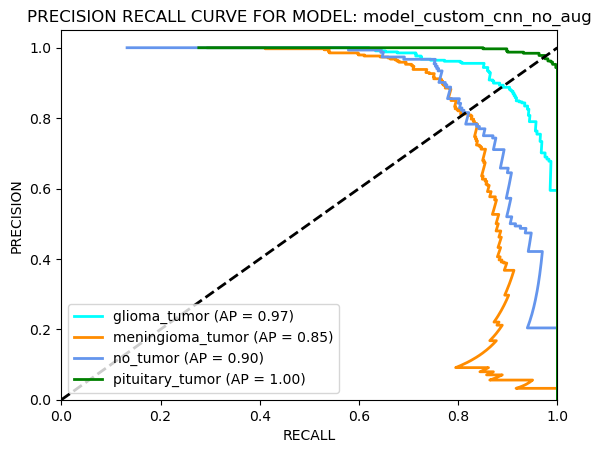

In [468]:
get_precision_recall_curves(model_custom_cnn_no_aug, test_dataloader_grayscale_no_aug, 'model_custom_cnn_no_aug')

# PIP LIST TO SEE ALL INSTALLED MODULES

In [53]:
!pip list

Package                       Version
----------------------------- ---------------
aiobotocore                   2.5.0
aiofiles                      22.1.0
aiohttp                       3.8.5
aioitertools                  0.7.1
aiosignal                     1.2.0
aiosqlite                     0.18.0
alabaster                     0.7.12
anaconda-anon-usage           0.4.2
anaconda-catalogs             0.2.0
anaconda-client               1.12.1
anaconda-cloud-auth           0.1.3
anaconda-navigator            2.5.1
anaconda-project              0.11.1
anyio                         3.5.0
appdirs                       1.4.4
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.3
astroid                       2.14.2
astropy                       5.1
asttokens                     2.0.5
async-timeout                 4.0.2
atomicwrites                  1.4.0
attrs                         22.1.0
Automat                       20.2.0
autopep8